In [824]:
import os
import re
import pandas as pd
import numpy as np
import urllib.request
import shutil
import xml.etree.ElementTree as ET
import matplotlib
import matplotlib.pyplot as plt
import pylab as pl
from dateutil.relativedelta import relativedelta
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import datetime
from sklearn.metrics import mean_squared_error
import matplotlib.dates as md
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

sns.set_style("whitegrid")
%matplotlib inline
pd.options.mode.chained_assignment = None

### Group by all 24 hours individually and take average capacity for each station

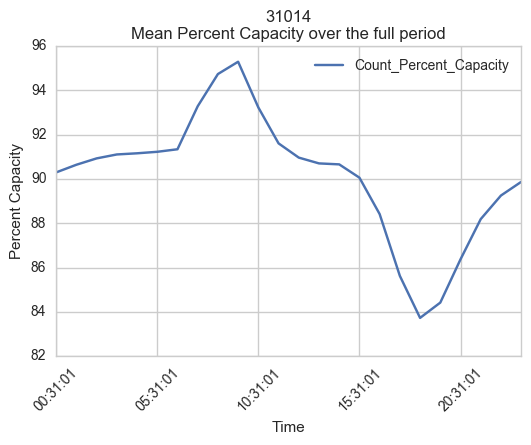

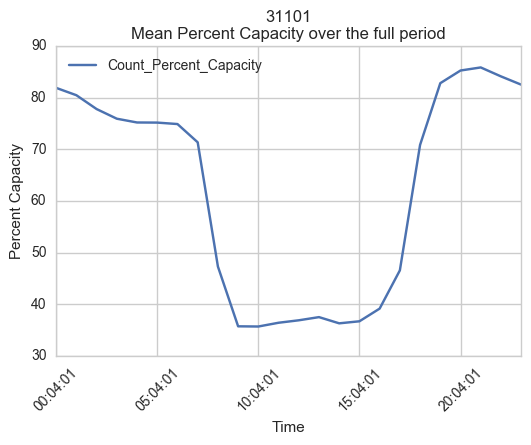

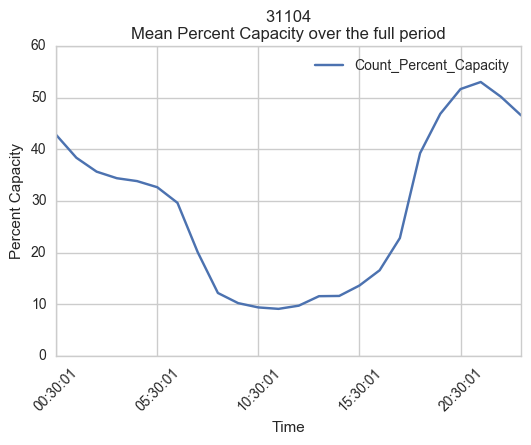

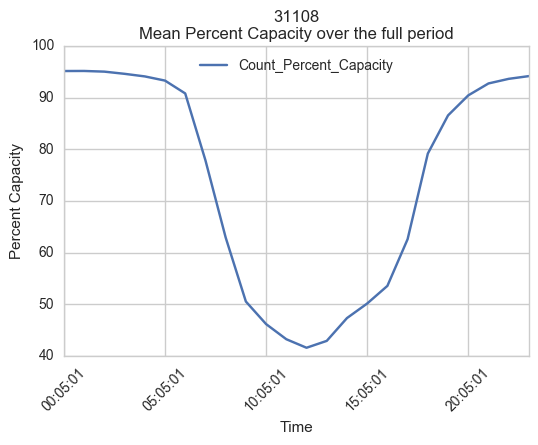

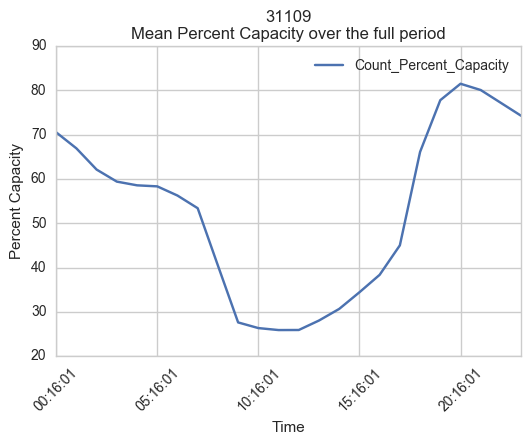

...

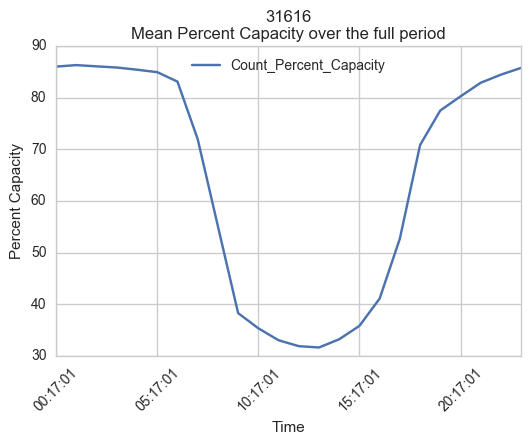

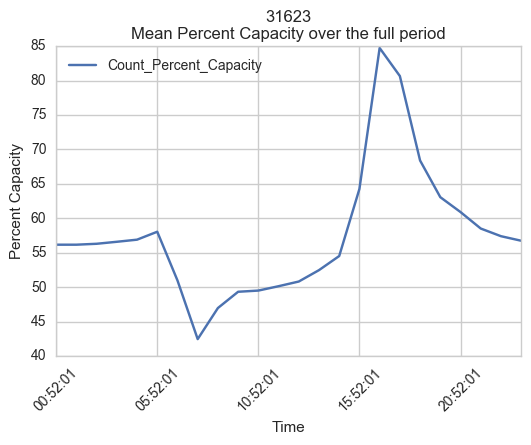

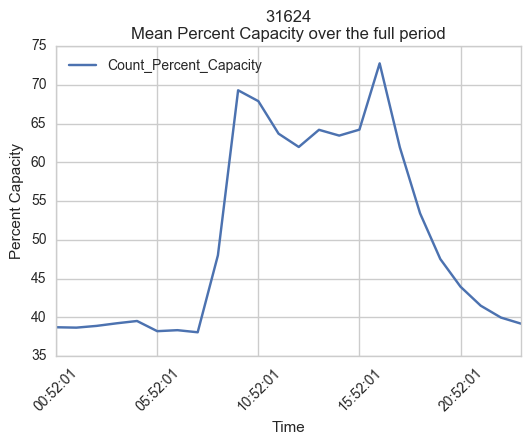

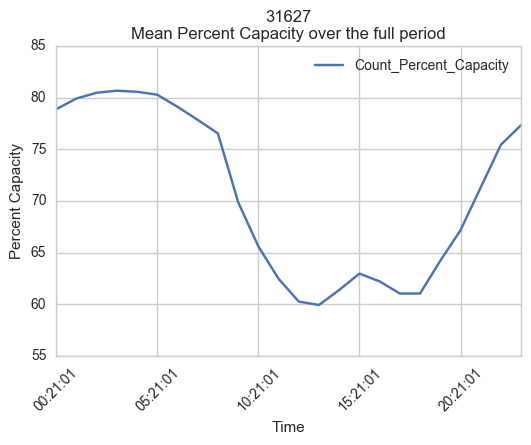

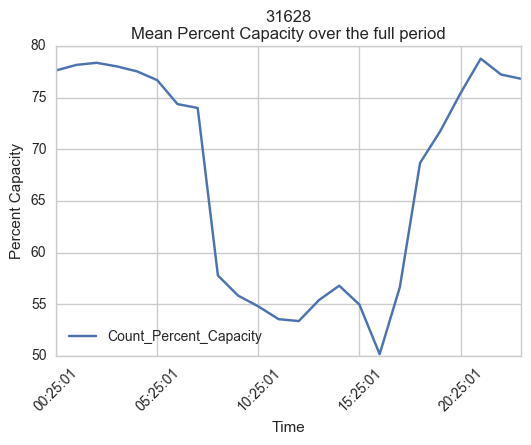

In [503]:
for station in sorted(list(new_target_discrete_bike_data['Station_Number'].unique())):

    # Create the station dataframe
    X = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    X.drop(['Station_Number', 'Bike_Count', 'Start_Station_Capacity'], axis=1, inplace=True)

    # Transform the dataframe and groupby Date to take the mean
    mean_test = X.copy()
    mean_test['Date'] = mean_test['Date'].apply(lambda x: str(x).split()[1])
    mean_test = mean_test.groupby('Date').mean()

    # Plot the dataframe
    mean_test.plot()
    plt.xticks(rotation=45)
    plt.ylabel('Percent Capacity')
    plt.xlabel('Time')
    plt.title('{}\nMean Percent Capacity over the full period'.format(station))
    plt.show();

# Try Hierarchical Clustering

In [516]:
# Create the mean capacity dictionary
mean_capacity_dict = {}
for station in sorted(list(new_target_discrete_bike_data['Station_Number'].unique())):

    # Create the station dataframe
    X = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    X.drop(['Station_Number', 'Bike_Count', 'Start_Station_Capacity'], axis=1, inplace=True)

    # Transform the dataframe and groupby Date to take the mean
    mean_test = X.copy()
    mean_test['Date'] = mean_test['Date'].apply(lambda x: str(x).split()[1])
    mean_test = mean_test.groupby('Date').mean()
    mean_capacity_dict[station] = mean_test.reset_index(drop=True)

In [684]:
# Transform the mean capacity dictionary for use in clustering algorithm
cluster_df = pd.DataFrame()
for station in sorted(list(mean_capacity_dict.keys())):
    temp_df = mean_capacity_dict[station].T.reset_index(drop=True)
    temp_df['Station'] = station
    cluster_df = cluster_df.append(temp_df)

cluster_df.reset_index(drop=True, inplace=True)
cluster_df

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,Station
0,90.295428,90.640309,90.927377,91.105392,91.157508,91.225366,91.339915,93.280917,94.736308,95.292532,...,90.057254,88.412300,85.620694,83.723959,84.415364,86.369654,88.185572,89.250556,89.867046,31014
1,81.908464,80.487081,77.809929,75.940612,75.210973,75.187866,74.908058,71.372725,47.333205,35.759993,...,36.732239,39.189061,46.587938,70.874622,82.818063,85.269287,85.864895,84.132586,82.532808,31101
2,42.807369,38.383204,35.694714,34.424566,33.866550,32.681984,29.658753,20.113606,12.211392,10.249838,...,13.654294,16.606623,22.836002,39.269165,46.886220,51.678190,53.045852,50.184821,46.575795,31104
3,95.169794,95.183296,95.052088,94.629063,94.128340,93.318010,90.831436,77.890136,62.955195,50.557360,...,50.171633,53.585442,62.628247,79.195010,86.583638,90.456719,92.765514,93.657457,94.188349,31108
4,70.523071,66.907724,62.113226,59.393676,58.554981,58.321684,56.248510,53.386373,40.446208,27.597737,...,34.404268,38.347023,45.005039,66.100128,77.782777,81.490531,80.074839,77.164167,74.252215,31109
5,55.730640,56.953952,57.334204,57.483482,57.830182,58.417096,60.126167,53.971345,33.963933,30.033479,...,29.168607,31.947113,31.438379,36.923702,47.691655,49.691776,50.512858,52.654121,54.245467,31110
6,55.533743,53.553565,51.228645,49.839086,49.326319,48.867146,47.158784,40.197979,19.594183,12.916603,...,9.013828,10.637855,15.164614,30.746924,48.438277,54.652192,56.946433,57.904749,56.722929,31114
7,82.223626,82.123800,81.593650,81.290189,80.934518,80.504564,79.589033,71.846661,38.864915,33.593271,...,29.071711,33.772851,47.035337,67.996150,73.384872,76.284703,78.456883,81.027885,82.428910,31116
8,68.918626,69.569116,70.072599,69.621136,68.884086,67.413715,61.171360,38.973384,18.620022,14.781426,...,13.092339,17.936321,31.263796,54.471184,61.477978,63.143825,64.794116,66.065903,67.560757,31119
9,28.769279,29.587056,30.466249,30.583804,30.200305,29.175141,30.347026,42.885305,32.492786,21.467863,...,18.645169,18.028978,18.810773,17.552800,19.886183,23.439039,25.299553,26.774356,28.367888,31121


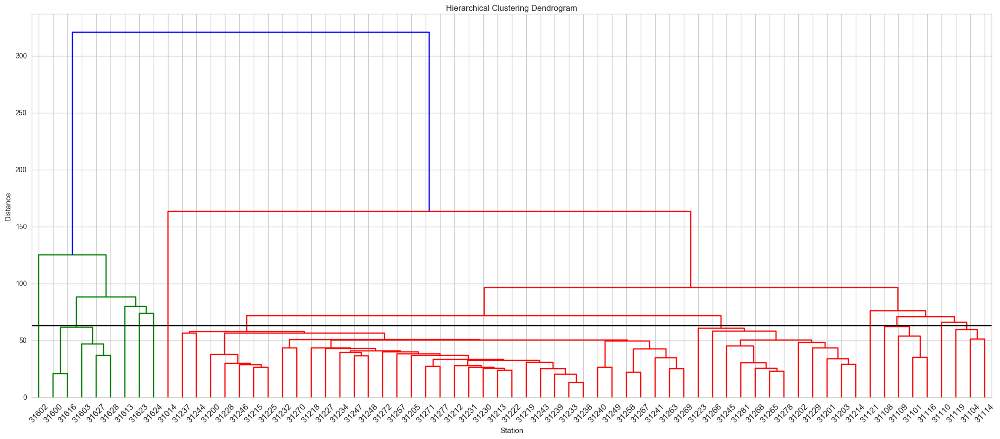

In [855]:
# Create a linkage object and plot dendogram

# What should I choose as the method? single, average, complete, ward, weighted, centroid, median?
Z = linkage(cluster_df, method='single', metric='euclidean')

plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Station')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=45, leaf_font_size=12, labels=list(cluster_df['Station']))
plt.axhline(y=63, c='k')
plt.show()

In [856]:
fcluster(Z, t=63, criterion='distance')

array([12,  8,  9,  8,  8, 10,  9,  8,  9, 11,  6,  7,  7,  7,  6,  6,  6,
        7,  6,  6,  6,  6,  7,  6,  6,  6,  7,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  7,  6,  6,  6,  6,  6,  6,  6,  7,  7,  6,  7,
        6,  6,  6,  6,  6,  7,  7,  1,  5,  1,  4,  1,  2,  3,  1,  1], dtype=int32)

In [870]:
clusters = fcluster(Z, t=63, criterion='distance')

cluster_assignments = pd.DataFrame()
cluster_assignments['Station'] = cluster_df['Station']
cluster_assignments['Cluster'] = clusters.T
cluster_assignments = cluster_assignments.sort_values(by='Cluster')
cluster_assignments.head()

,Station,Cluster
66,31628,1
62,31616,1
60,31603,1
58,31600,1
65,31627,1


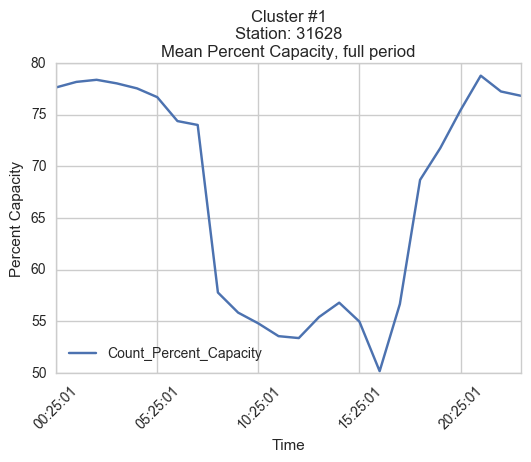

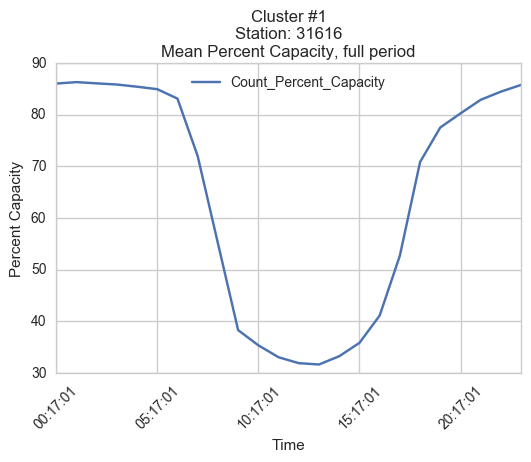

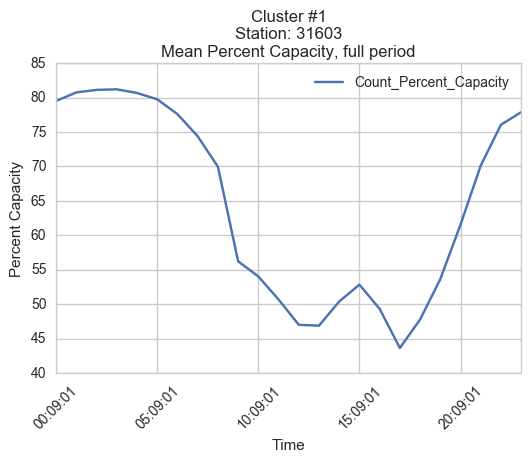

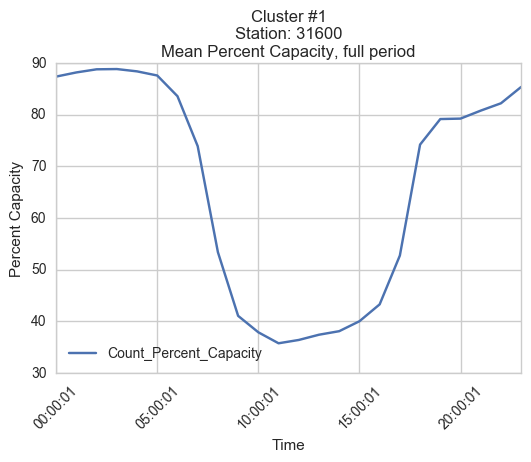

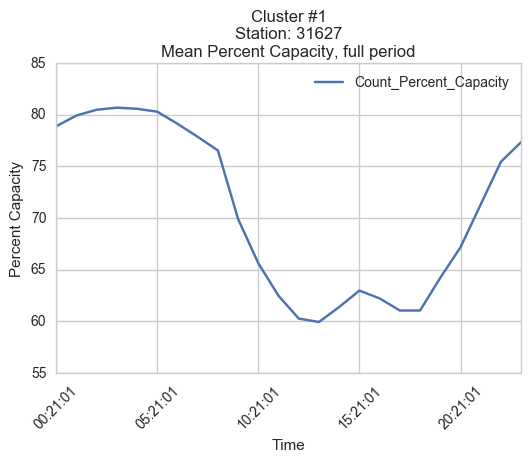

...

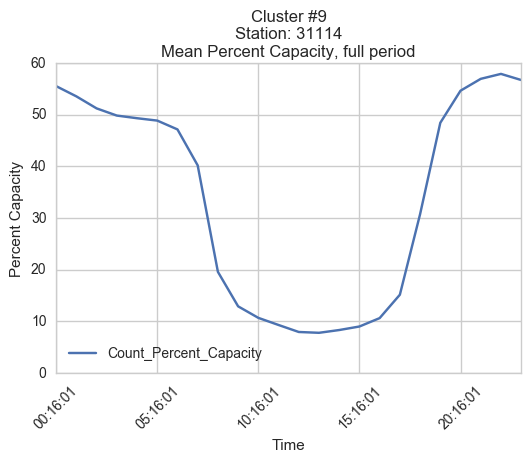

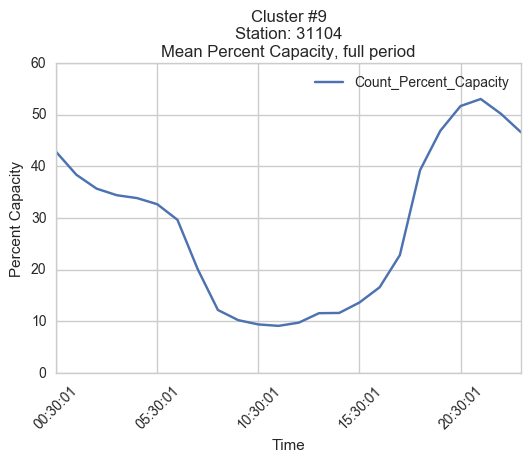

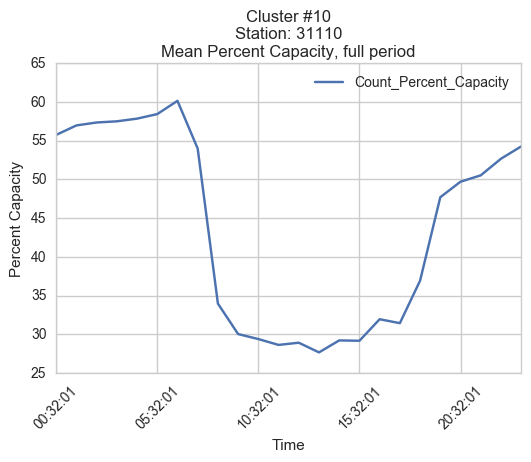

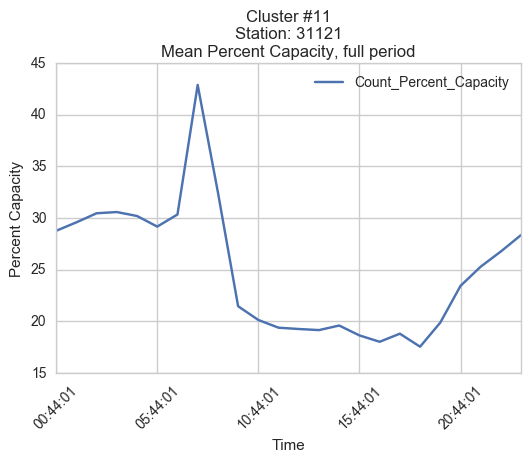

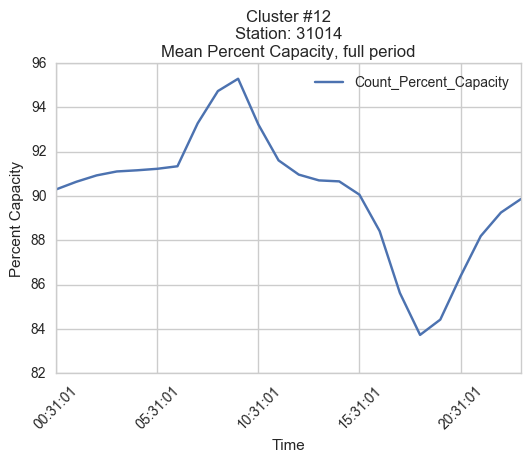

In [858]:
for row in cluster_assignments.itertuples():

    # Create the station dataframe
    X = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == row[1]]
    X.drop(['Station_Number', 'Bike_Count', 'Start_Station_Capacity'], axis=1, inplace=True)

    # Transform the dataframe and groupby Date to take the mean
    mean_test = X.copy()
    mean_test['Date'] = mean_test['Date'].apply(lambda x: str(x).split()[1])
    mean_test = mean_test.groupby('Date').mean()

    # Plot the dataframe
    mean_test.plot()
    plt.xticks(rotation=45)
    plt.ylabel('Percent Capacity')
    plt.xlabel('Time')
    plt.title('Cluster #{}\nStation: {}\nMean Percent Capacity, full period'.format(row[2], row[1]))
    plt.show();

Cluster #1
Station: 31628


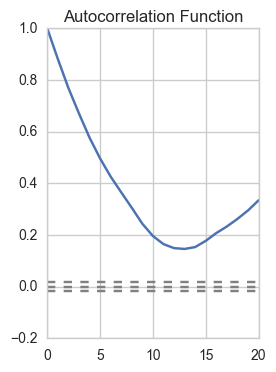

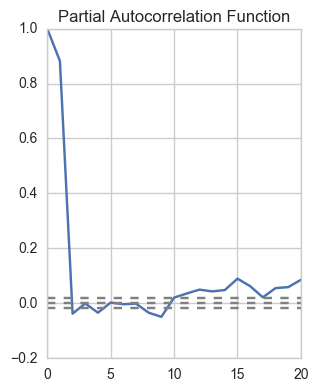

Cluster #1
Station: 31616


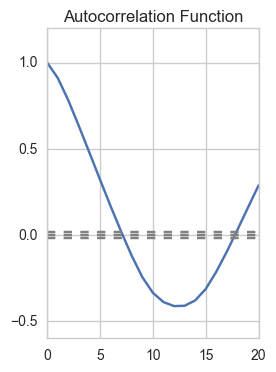

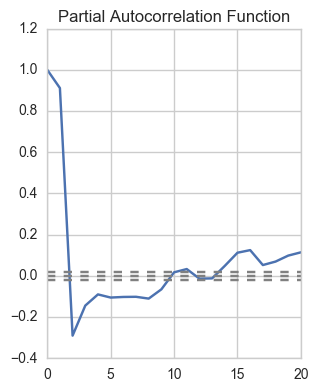

Cluster #1
Station: 31603


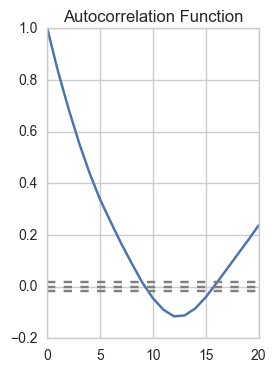

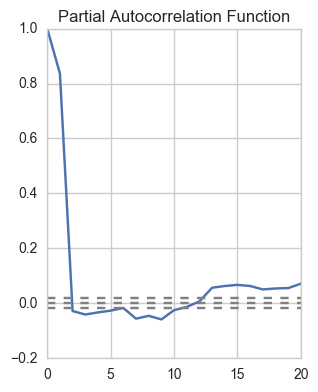

Cluster #1
Station: 31600


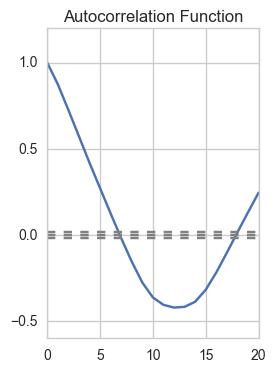

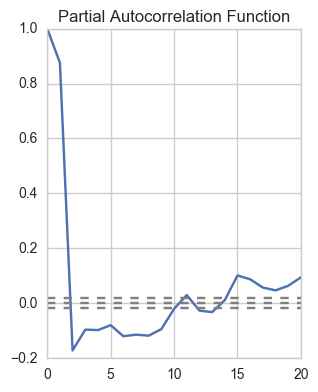

Cluster #1
Station: 31627


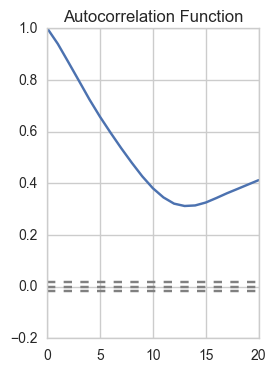

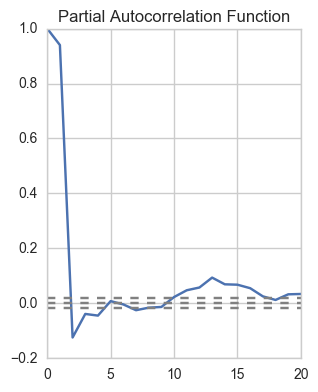

Cluster #2
Station: 31623


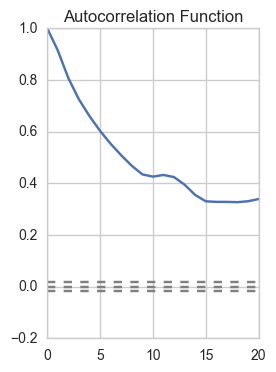

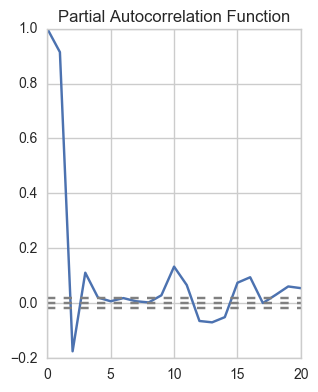

Cluster #3
Station: 31624


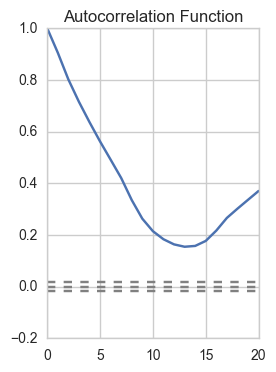

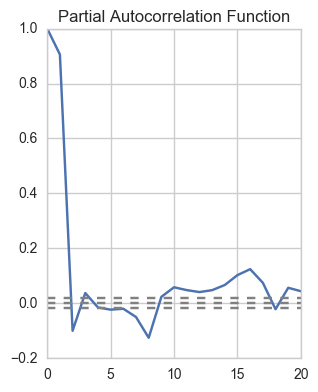

Cluster #4
Station: 31613


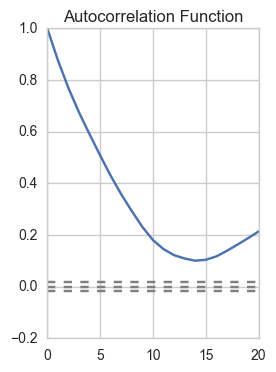

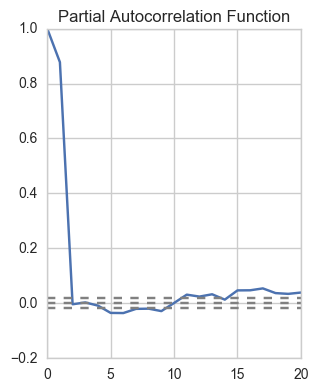

Cluster #5
Station: 31602


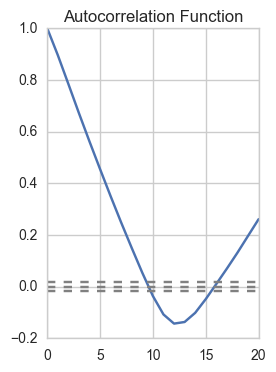

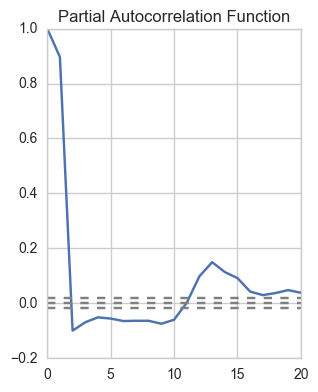

Cluster #6
Station: 31246


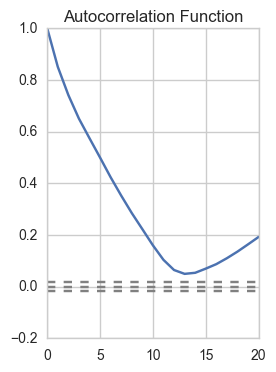

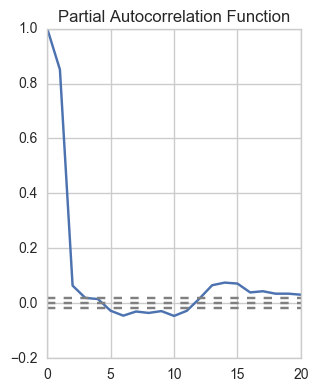

Cluster #6
Station: 31244


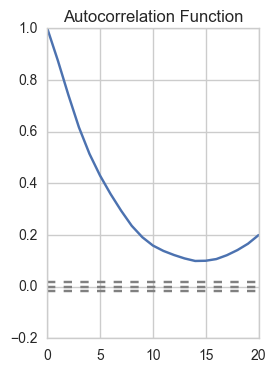

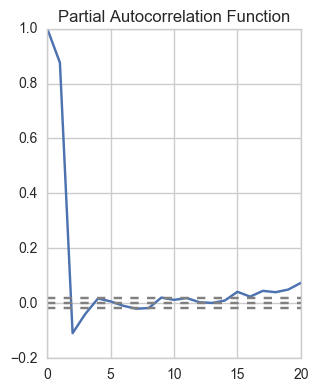

Cluster #6
Station: 31243


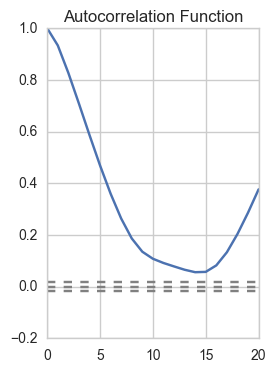

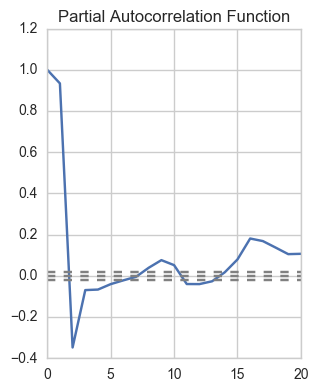

Cluster #6
Station: 31237


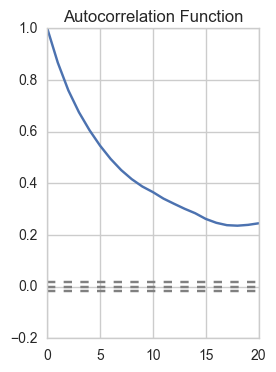

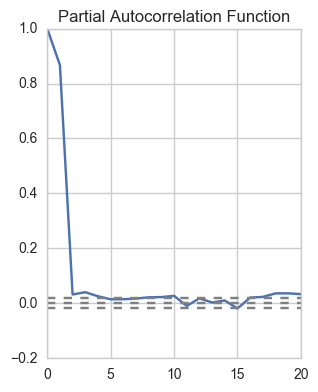

Cluster #6
Station: 31240


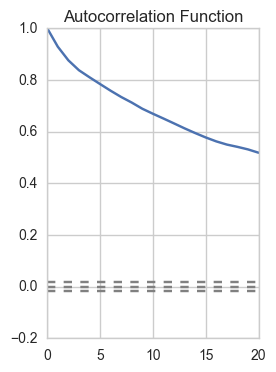

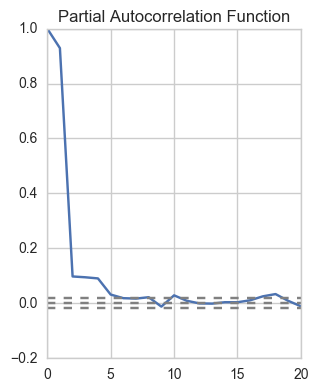

Cluster #6
Station: 31239


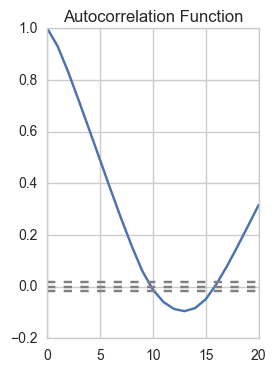

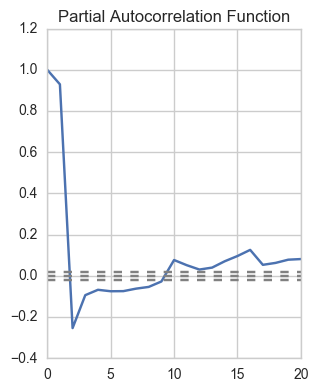

Cluster #6
Station: 31247


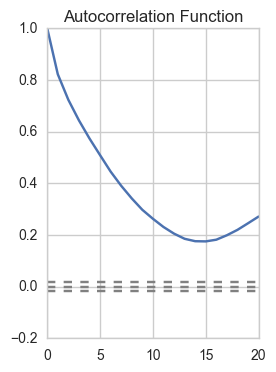

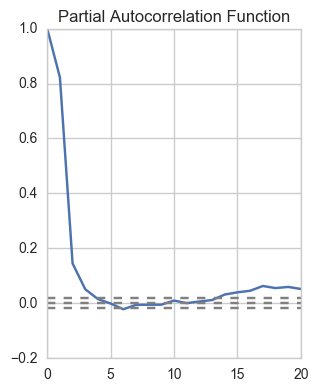

Cluster #6
Station: 31241


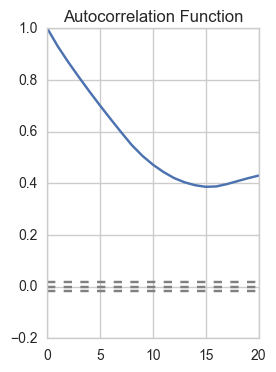

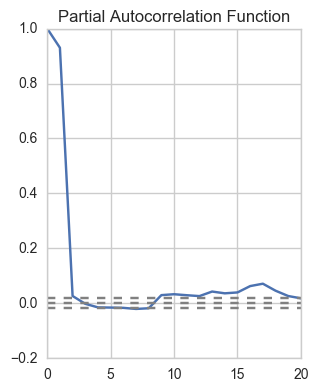

Cluster #6
Station: 31248


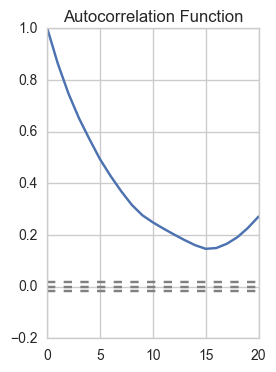

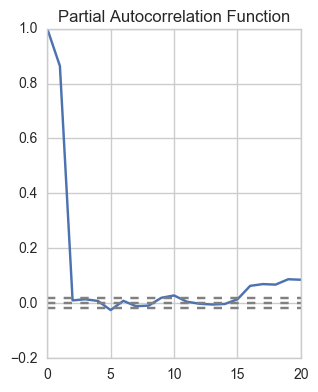

Cluster #6
Station: 31263


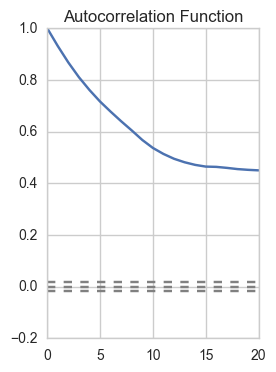

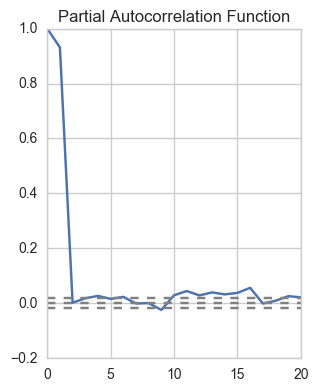

Cluster #6
Station: 31257


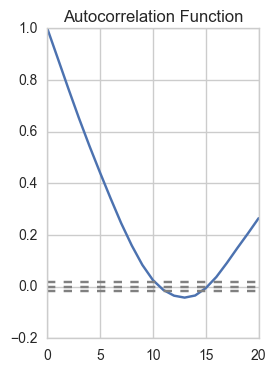

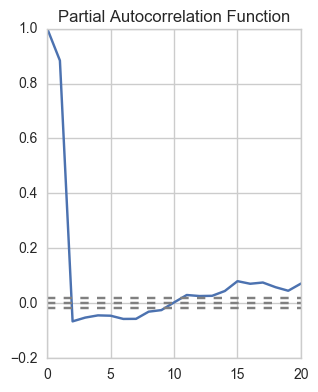

Cluster #6
Station: 31258


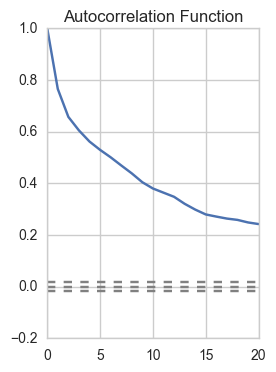

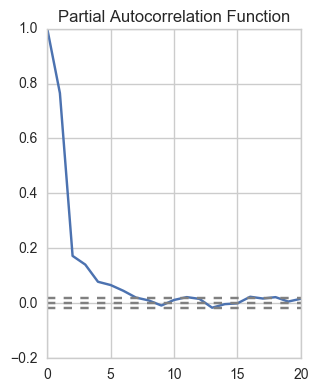

Cluster #6
Station: 31234


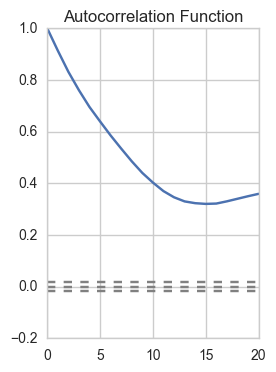

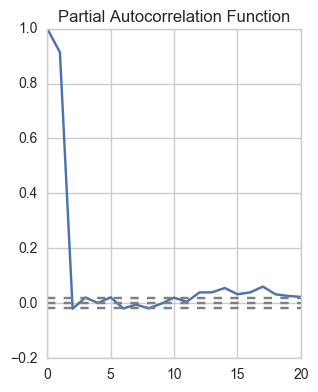

Cluster #6
Station: 31267


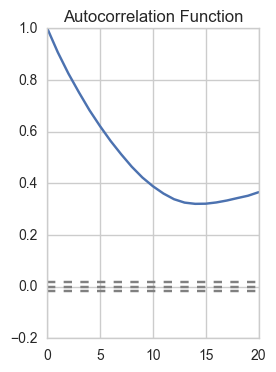

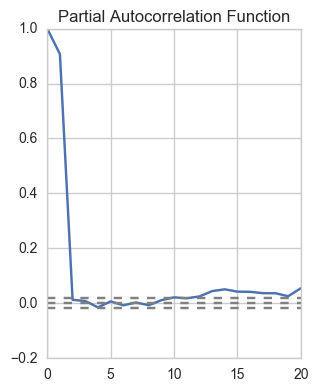

Cluster #6
Station: 31269


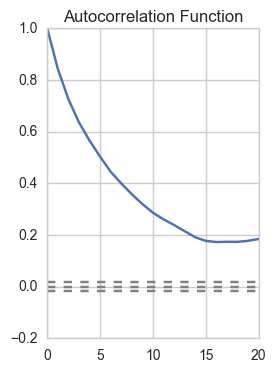

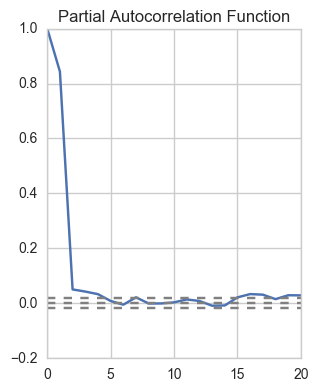

Cluster #6
Station: 31270


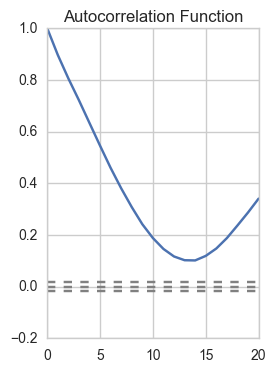

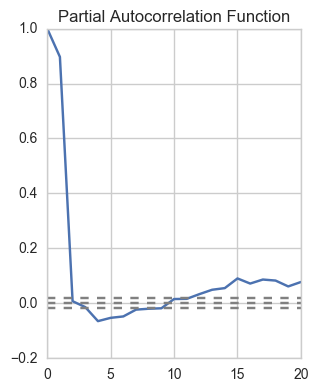

Cluster #6
Station: 31271


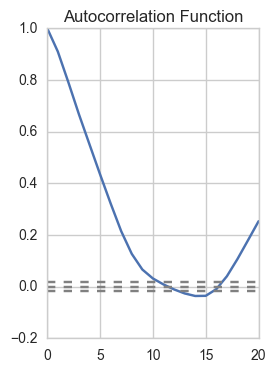

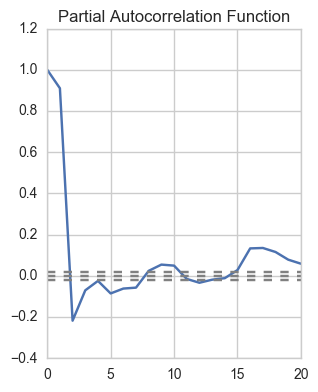

Cluster #6
Station: 31272


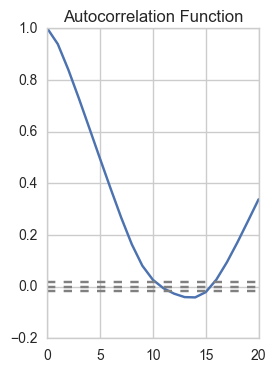

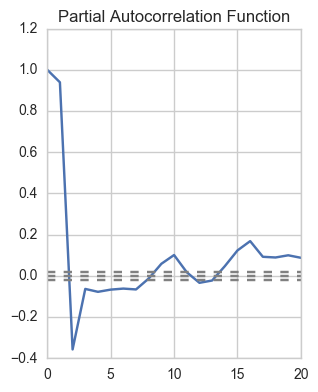

Cluster #6
Station: 31277


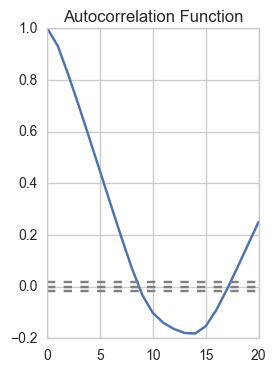

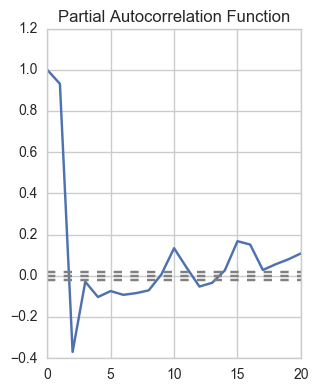

Cluster #6
Station: 31249


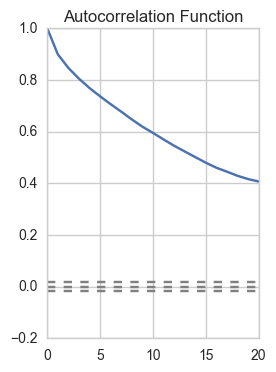

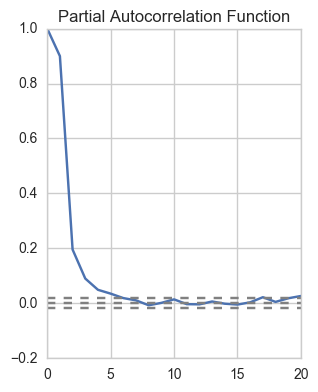

Cluster #6
Station: 31233


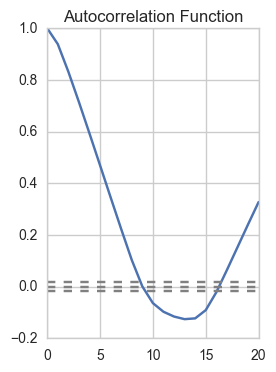

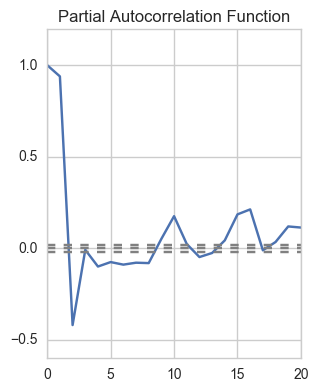

Cluster #6
Station: 31238


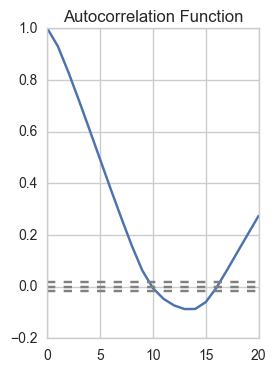

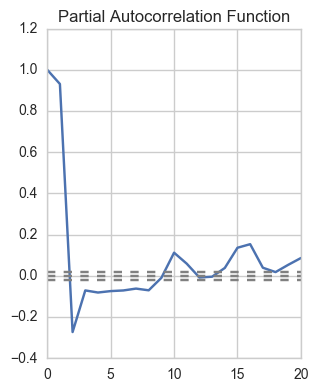

Cluster #6
Station: 31231


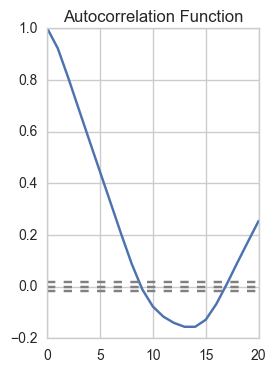

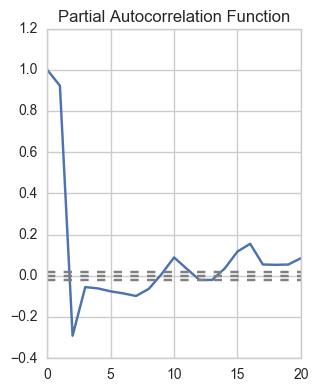

Cluster #6
Station: 31205


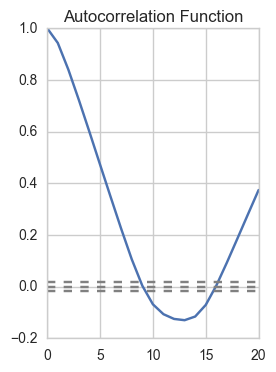

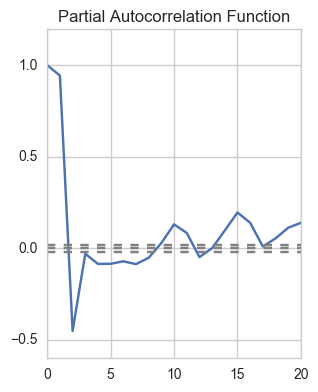

Cluster #6
Station: 31212


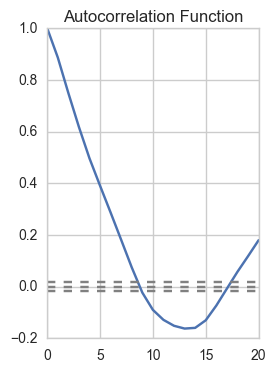

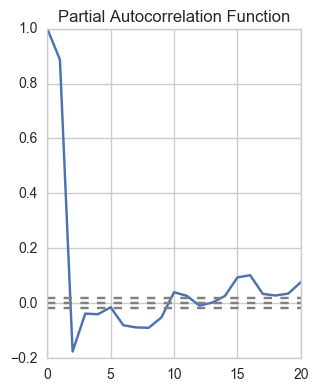

Cluster #6
Station: 31213


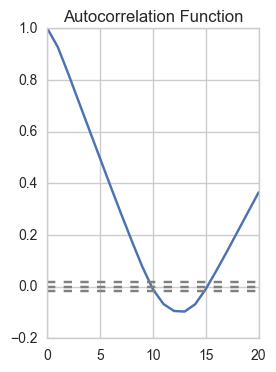

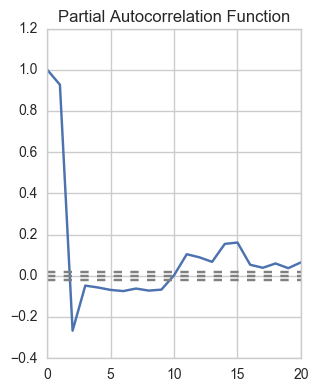

Cluster #6
Station: 31215


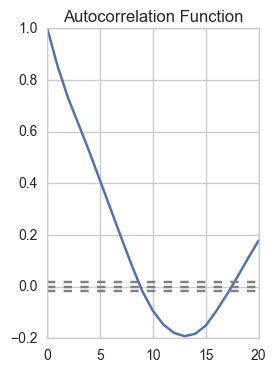

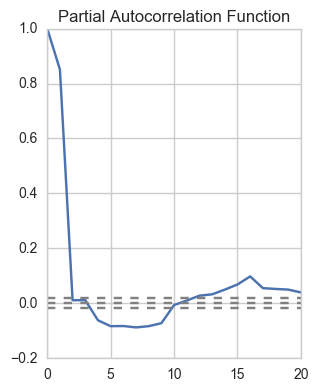

Cluster #6
Station: 31218


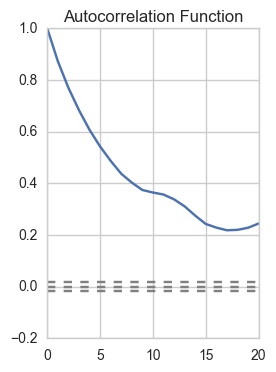

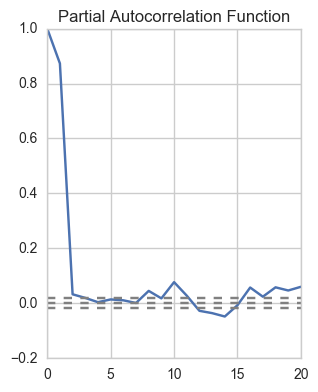

Cluster #6
Station: 31232


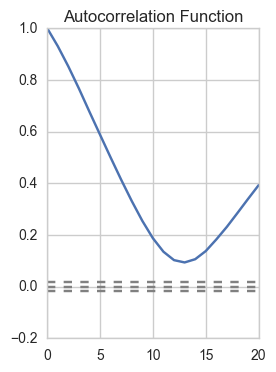

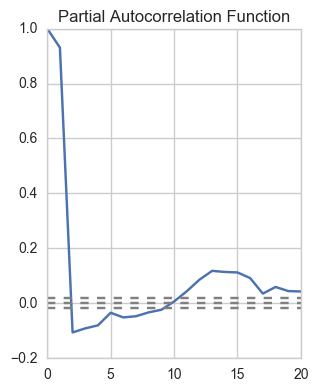

Cluster #6
Station: 31200


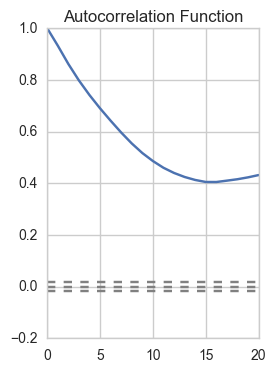

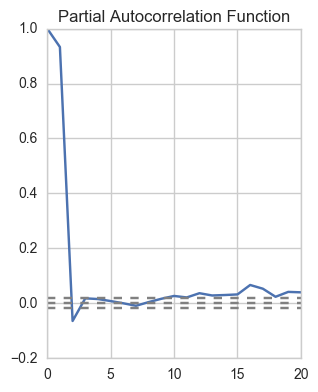

Cluster #6
Station: 31219


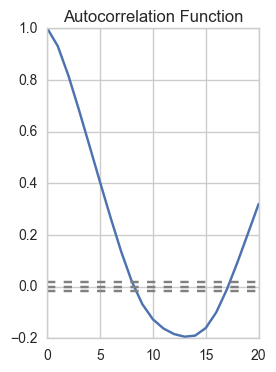

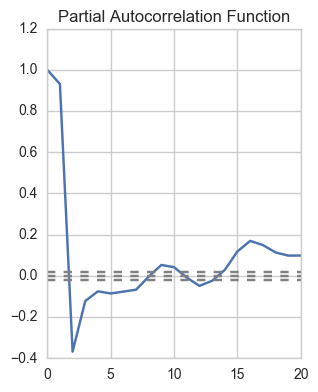

Cluster #6
Station: 31225


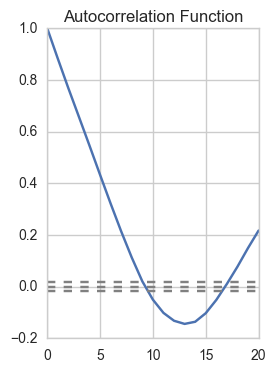

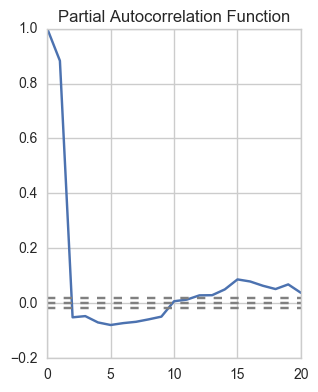

Cluster #6
Station: 31227


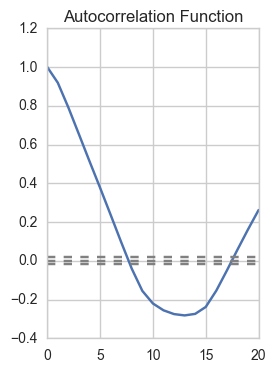

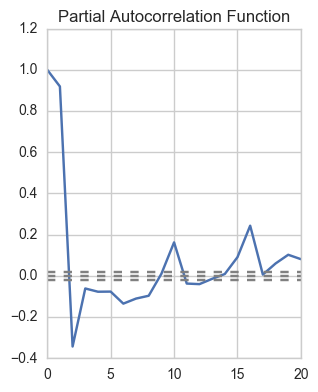

Cluster #6
Station: 31228


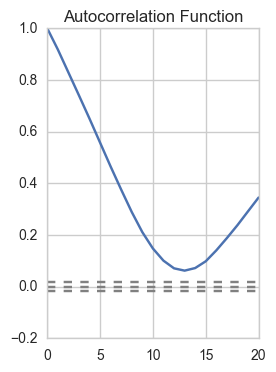

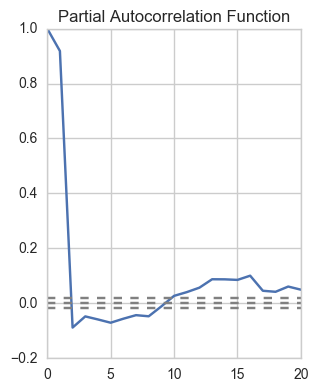

Cluster #6
Station: 31230


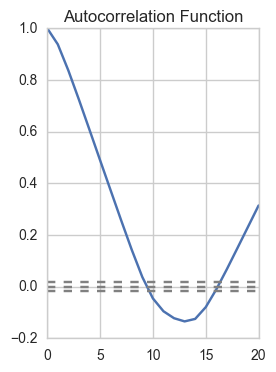

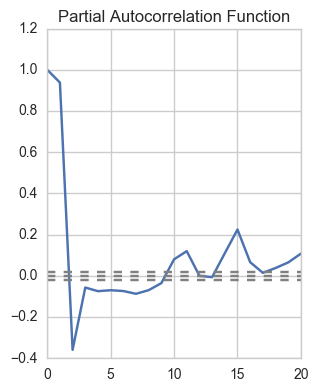

Cluster #6
Station: 31222


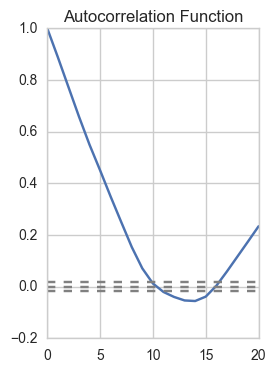

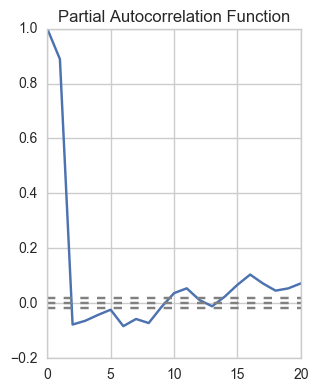

Cluster #7
Station: 31278


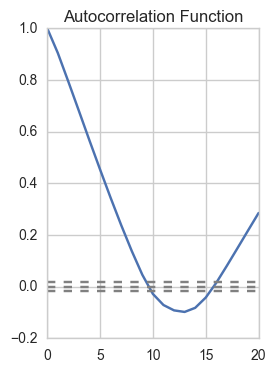

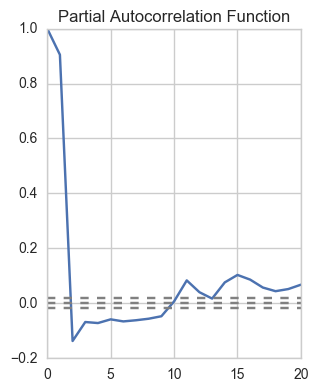

Cluster #7
Station: 31201


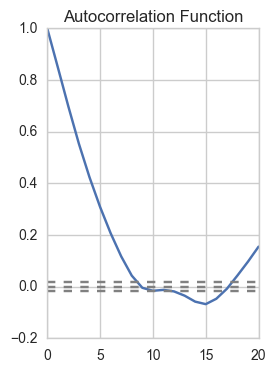

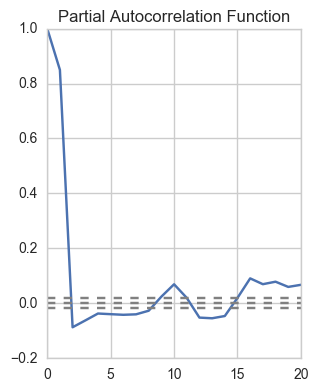

Cluster #7
Station: 31281


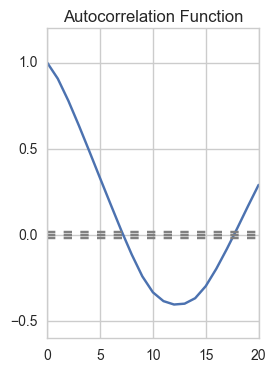

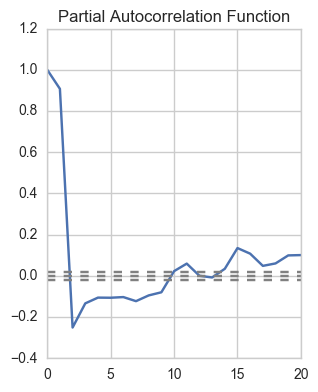

Cluster #7
Station: 31202


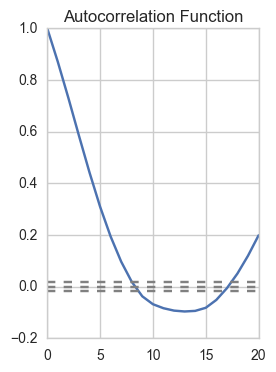

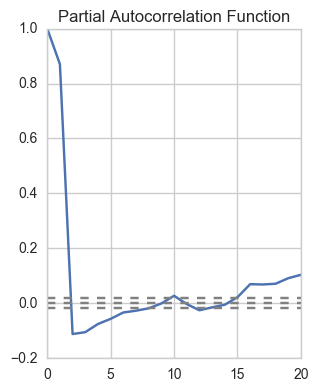

Cluster #7
Station: 31268


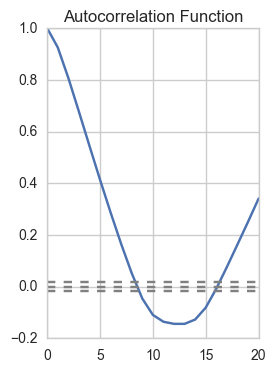

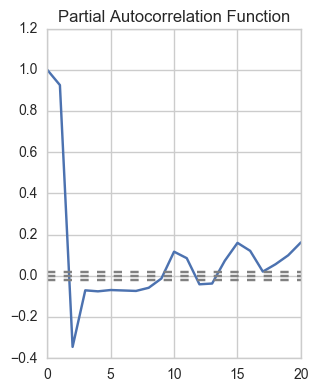

Cluster #7
Station: 31266


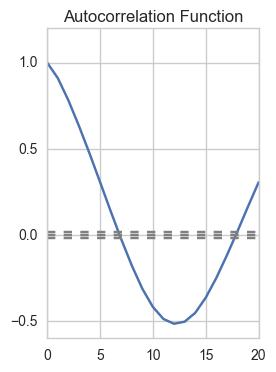

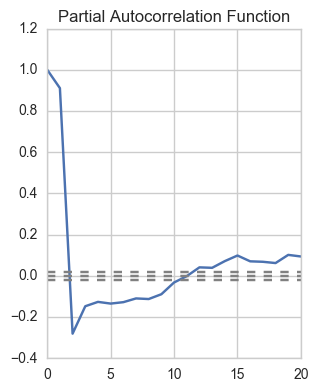

Cluster #7
Station: 31265


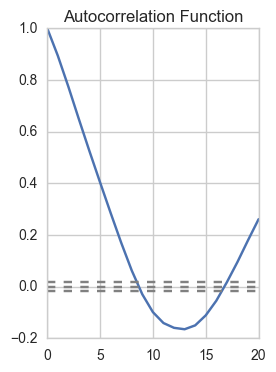

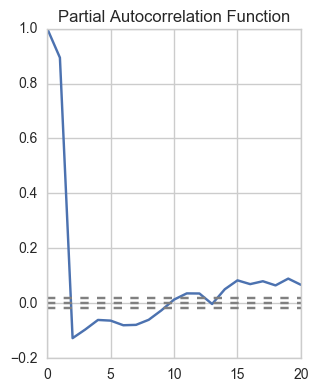

Cluster #7
Station: 31214


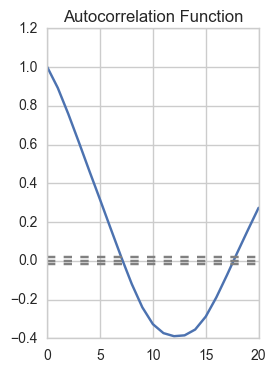

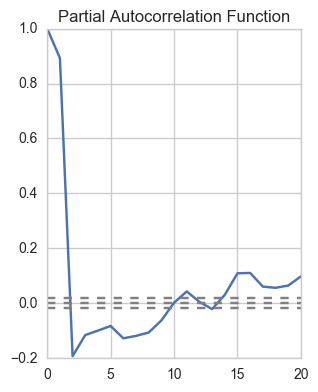

Cluster #7
Station: 31245


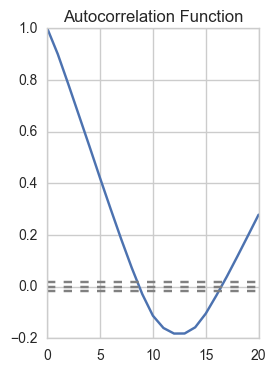

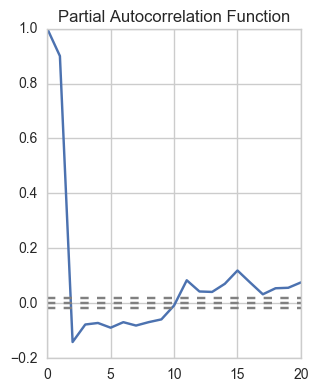

Cluster #7
Station: 31223


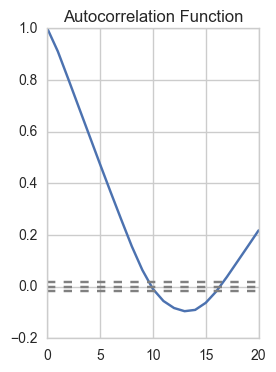

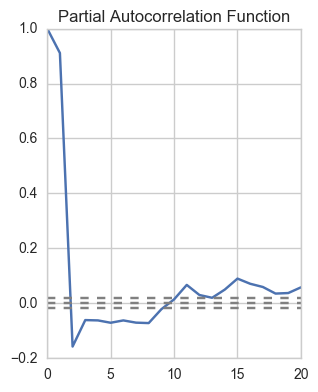

Cluster #7
Station: 31229


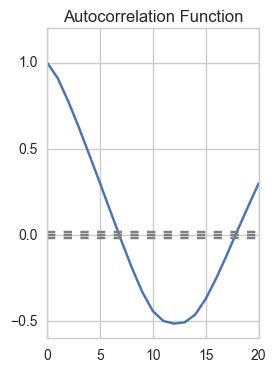

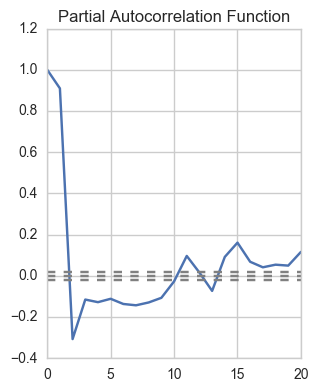

Cluster #7
Station: 31203


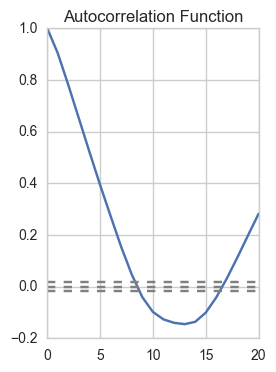

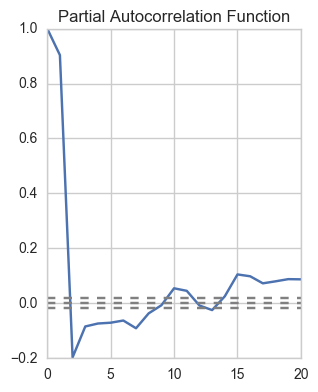

Cluster #8
Station: 31116


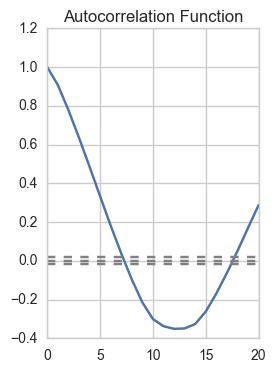

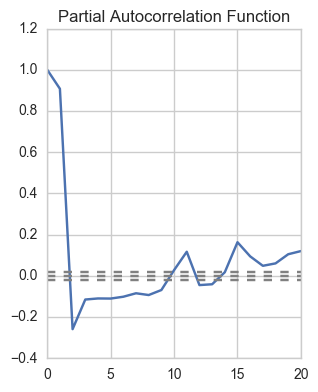

Cluster #8
Station: 31109


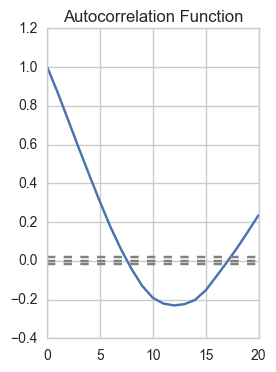

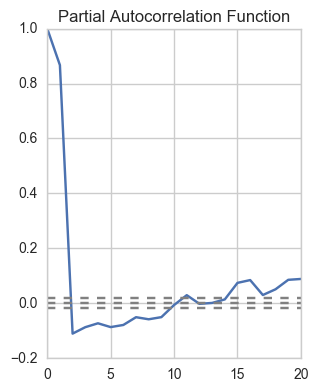

Cluster #8
Station: 31108


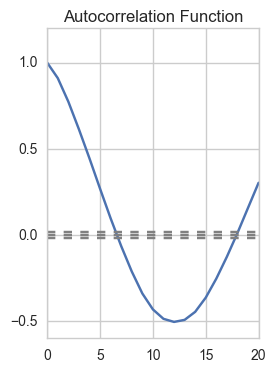

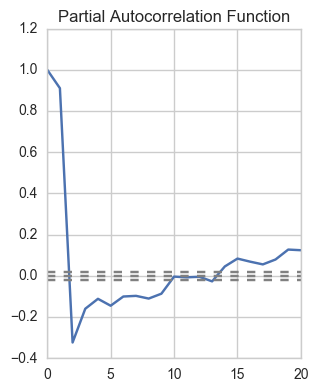

Cluster #8
Station: 31101


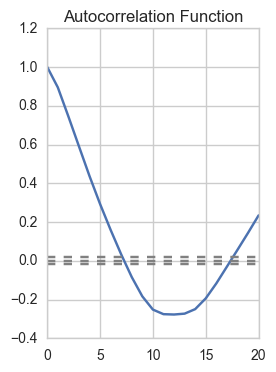

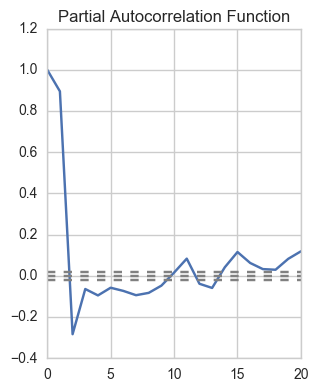

Cluster #9
Station: 31119


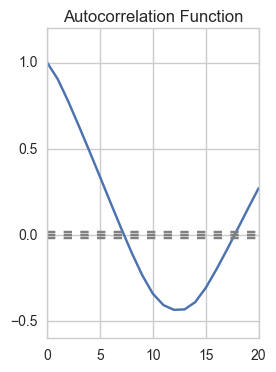

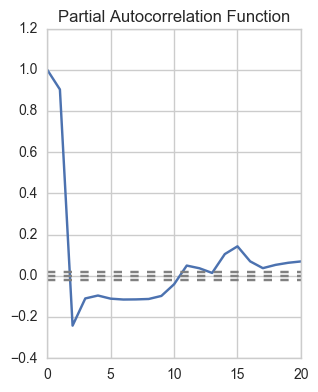

Cluster #9
Station: 31114


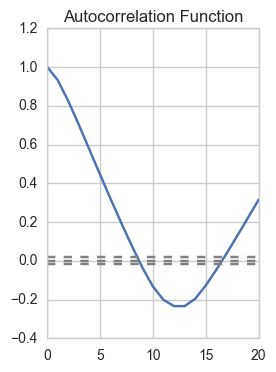

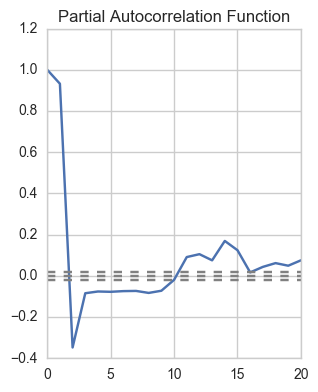

Cluster #9
Station: 31104


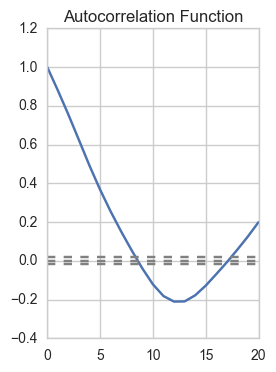

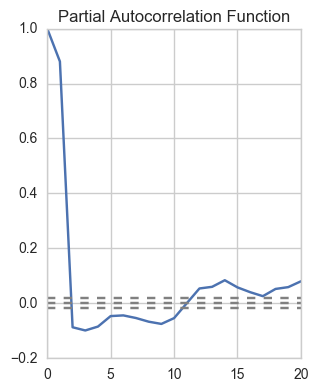

Cluster #10
Station: 31110


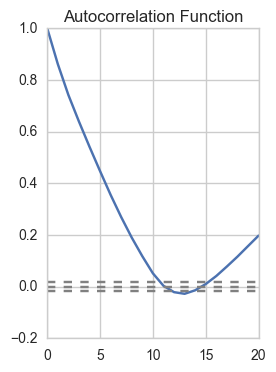

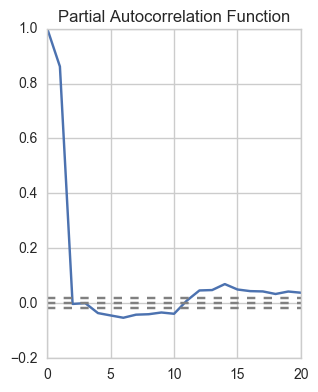

Cluster #11
Station: 31121


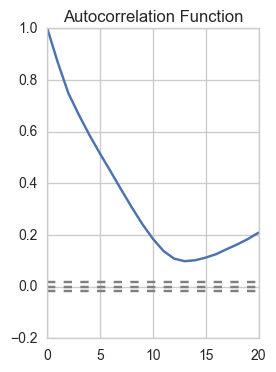

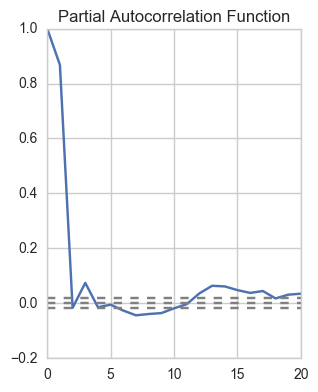

Cluster #12
Station: 31014


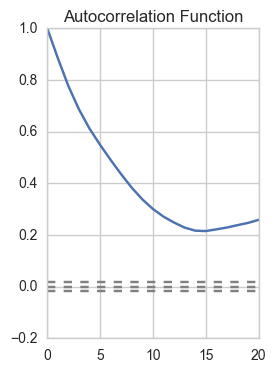

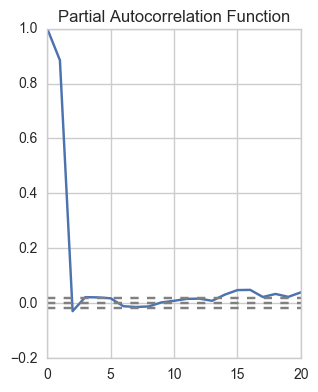

In [861]:
for row in cluster_assignments.itertuples():

    # Mask for station and transform to series object
    series_station = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == row[1]]
    series_station.set_index('Date', inplace=True)
    series_station.drop('Station_Number', axis=1, inplace=True)
    series_station = series_station['Count_Percent_Capacity'] 
    
    print('Cluster #{}\nStation: {}'.format(row[2], row[1]))
    
    # Create ACF and PACF plots as inputs to the ARIMA model
    # Plot ACF: 
    lag_acf = acf(series_station, nlags=20)
    plt.subplot(121) 
    plt.plot(lag_acf)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.title('Autocorrelation Function')
    plt.show()
    # Plot PACF:
    lag_pacf = pacf(series_station, nlags=20, method='ols')
    plt.subplot(122)
    plt.plot(lag_pacf)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(series_station)),linestyle='--',color='gray')
    plt.title('Partial Autocorrelation Function')
    plt.tight_layout()
    plt.show()

In [896]:
# Assume orders for each cluster
# Cluster 1: (2, 0, 7)
# Cluster 2: (2, 0, 0)
# Cluster 3: (2, 0, 0)
# Cluster 4: (2, 0, 0)
# Cluster 5: (2, 0, 9)
# Cluster 6: (3, 0, 0) or (3, 0, 8)
# Cluster 7: (2, 0, 8)
# Cluster 8: (2, 0, 7)
# Cluster 9: (2, 0, 8)
# Cluster 10: (2, 0, 11)
# Cluster 11: (2, 0, 0)
# Cluster 12: (2, 0, 0)

cluster_order_dict = {1:[2,0,7],
                      2:[2,0,0],
                      3:[2,0,0],
                      4:[2,0,0],
                      5:[2,0,9],
                      6:[3,0,8],
                      7:[2,0,8],
                      8:[2,0,7],
                      9:[2,0,8],
                      10:[2,0,11],
                      11:[2,0,0],
                      12:[2,0,0]}
cluster_order_dict

{1: [2, 0, 7],
 2: [2, 0, 0],
 3: [2, 0, 0],
 4: [2, 0, 0],
 5: [2, 0, 9],
 6: [3, 0, 8],
 7: [2, 0, 8],
 8: [2, 0, 7],
 9: [2, 0, 8],
 10: [2, 0, 11],
 11: [2, 0, 0],
 12: [2, 0, 0]}

In [897]:
(cluster_order_dict[1][0], 
                           cluster_order_dict[1][1], 
                           cluster_order_dict[1][2])

(2, 0, 7)

In [875]:
cluster_dict = {}
for cluster, stations in cluster_assignments.groupby('Cluster'):
    cluster_dict[cluster] = stations['Station'].tolist()
cluster_dict

{1: [31628, 31616, 31603, 31600, 31627],
 2: [31623],
 3: [31624],
 4: [31613],
 5: [31602],
 6: [31246,
  31244,
  31243,
  31237,
  31240,
  31239,
  31247,
  31241,
  31248,
  31263,
  31257,
  31258,
  31234,
  31267,
  31269,
  31270,
  31271,
  31272,
  31277,
  31249,
  31233,
  31238,
  31231,
  31205,
  31212,
  31213,
  31215,
  31218,
  31232,
  31200,
  31219,
  31225,
  31227,
  31228,
  31230,
  31222],
 7: [31278,
  31201,
  31281,
  31202,
  31268,
  31266,
  31265,
  31214,
  31245,
  31223,
  31229,
  31203],
 8: [31116, 31109, 31108, 31101],
 9: [31119, 31114, 31104],
 10: [31110],
 11: [31121],
 12: [31014]}

# Without Exogenous Variables

Station 31628
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



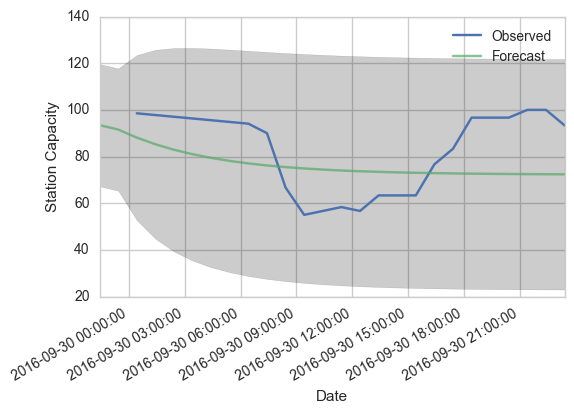

RMSE: 17.27


Station 31616
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



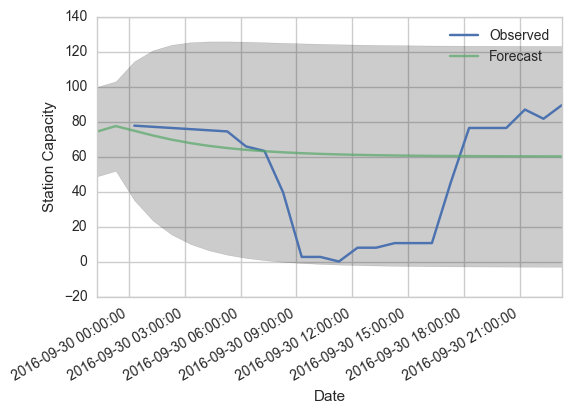

RMSE: 33.98


Station 31603
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



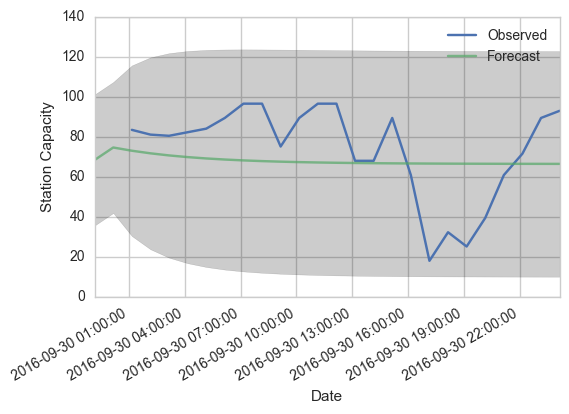

RMSE: 23.13


Station 31600
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



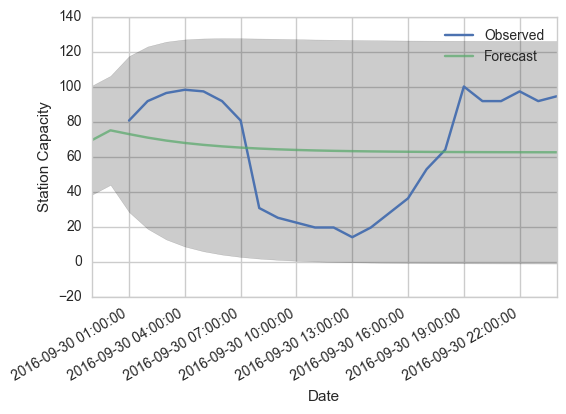

RMSE: 32.15


Station 31627
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



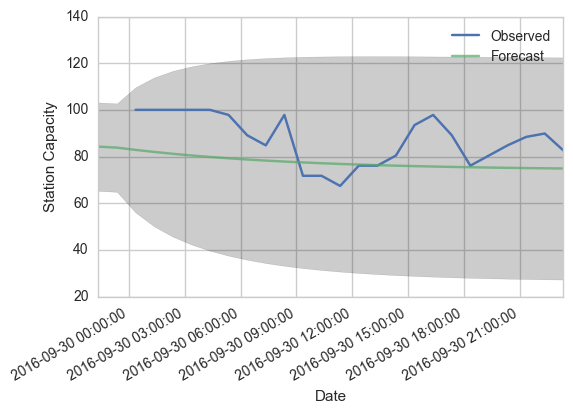

RMSE: 13.53




In [1006]:
# Cluster 1 generalization
cluster1_stations = cluster_dict[1]

rmse_dict1 = {}
for station in cluster1_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[2][0], 
                           cluster_order_dict[2][1], 
                           cluster_order_dict[2][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict1[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31623
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



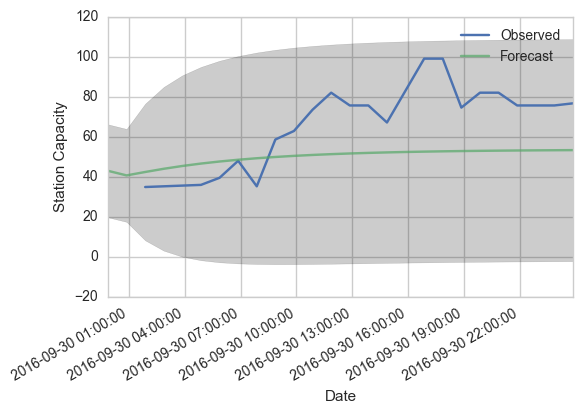

RMSE: 23.39




In [926]:
# Cluster 2 generalization
cluster2_stations = cluster_dict[2]

rmse_dict2 = {}
for station in cluster2_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[2][0], 
                           cluster_order_dict[2][1], 
                           cluster_order_dict[2][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict2[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31624
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



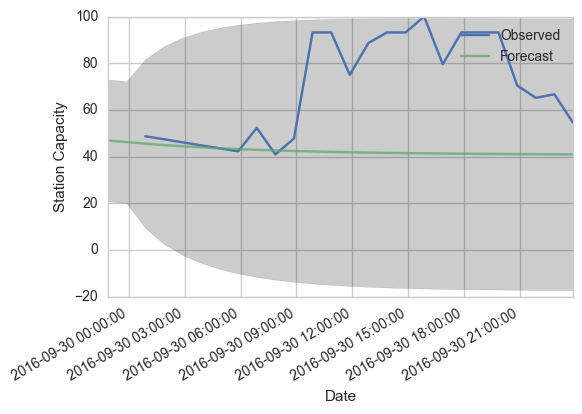

RMSE: 34.96




In [1020]:
# Cluster 3 generalization
cluster3_stations = cluster_dict[3]

rmse_dict3 = {}
for station in cluster3_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[3][0], 
                           cluster_order_dict[3][1], 
                           cluster_order_dict[3][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict3[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31613
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



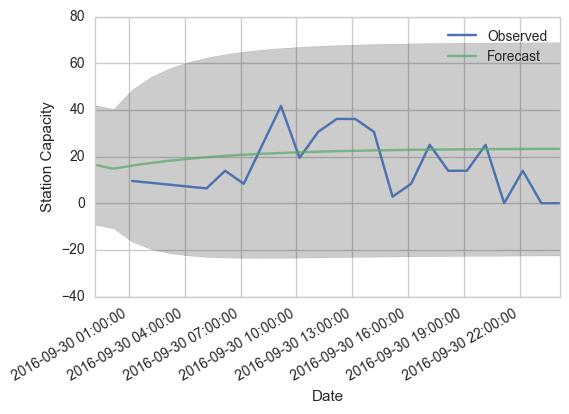

RMSE: 13.18




In [927]:
# Cluster 4 generalization
cluster4_stations = cluster_dict[4]

rmse_dict4 = {}
for station in cluster4_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[4][0], 
                           cluster_order_dict[4][1], 
                           cluster_order_dict[4][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict4[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31602
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


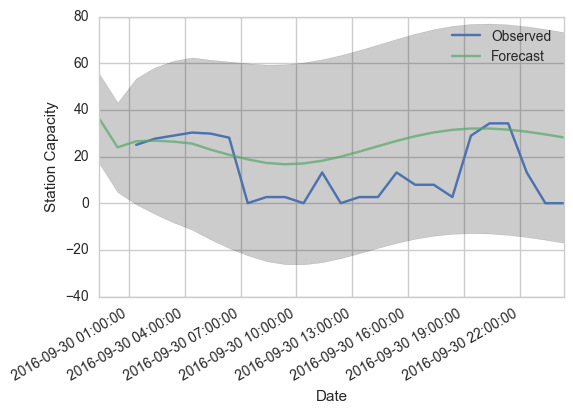

RMSE: 16.33




In [928]:
# Cluster 5 generalization
cluster5_stations = cluster_dict[5]

rmse_dict5 = {}
for station in cluster5_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[5][0], 
                           cluster_order_dict[5][1], 
                           cluster_order_dict[5][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict5[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31246
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


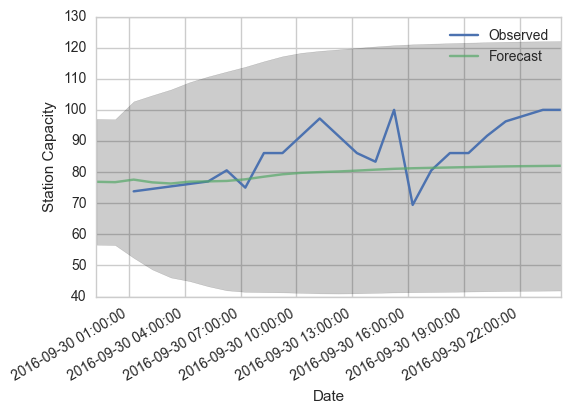

RMSE: 10.23


Station 31244
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


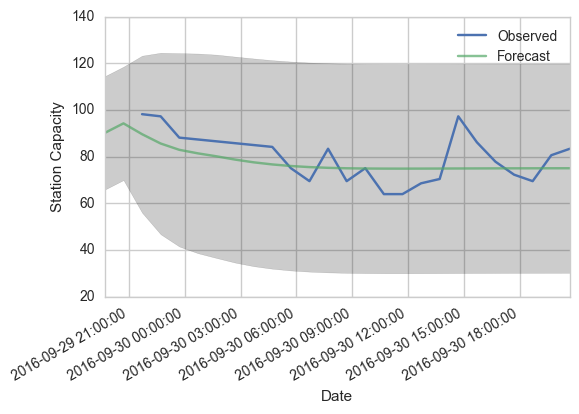

RMSE: 8.36


Station 31243
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


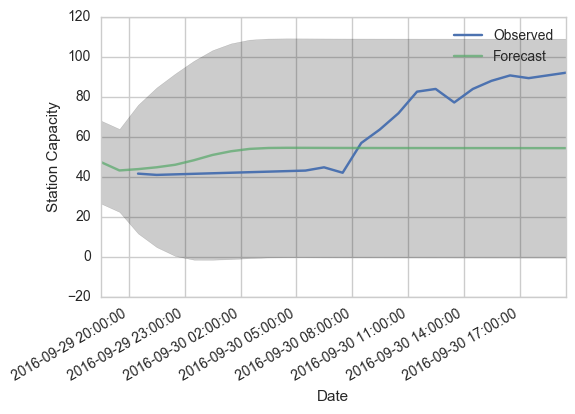

RMSE: 21.36


Station 31237
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



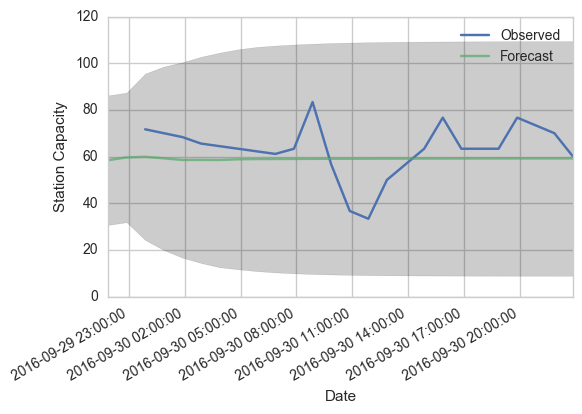

RMSE: 11.80


Station 31240
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


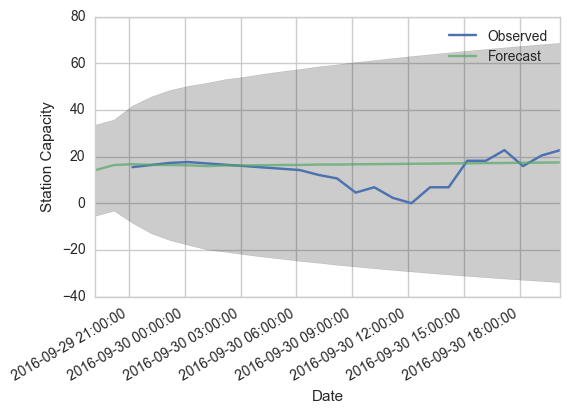

RMSE: 6.74


Station 31239
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


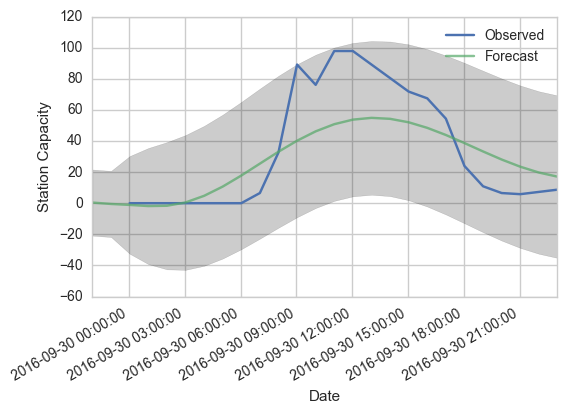

RMSE: 23.01


Station 31247
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


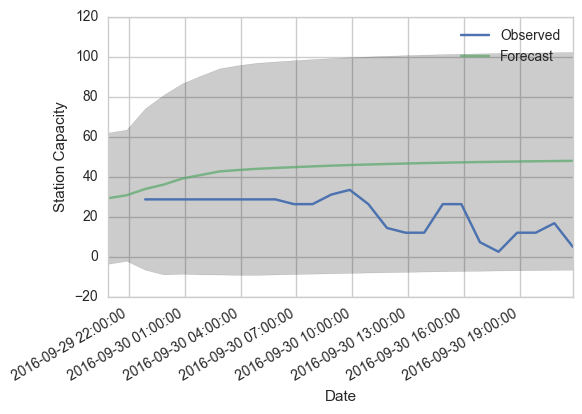

RMSE: 25.80


Station 31241
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


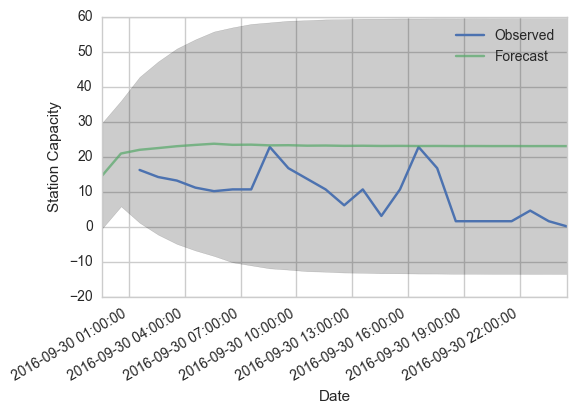

RMSE: 14.94


Station 31248
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



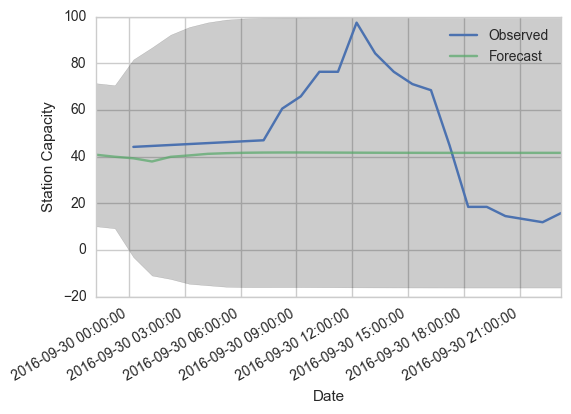

RMSE: 25.36


Station 31263
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


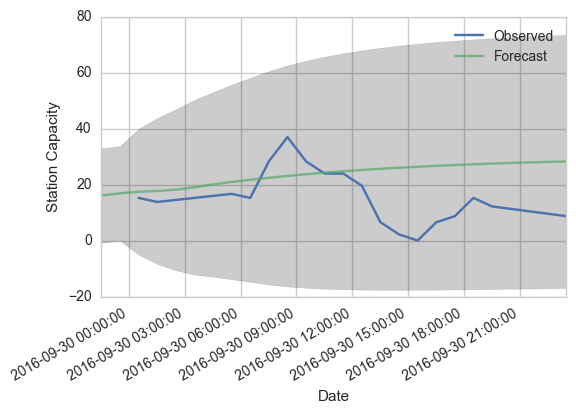

RMSE: 13.61


Station 31257
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


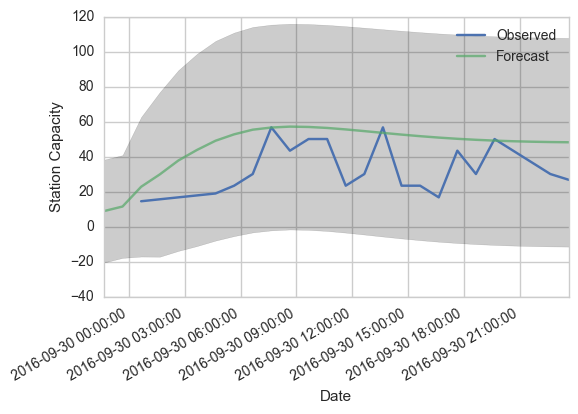

RMSE: 20.34


Station 31258
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


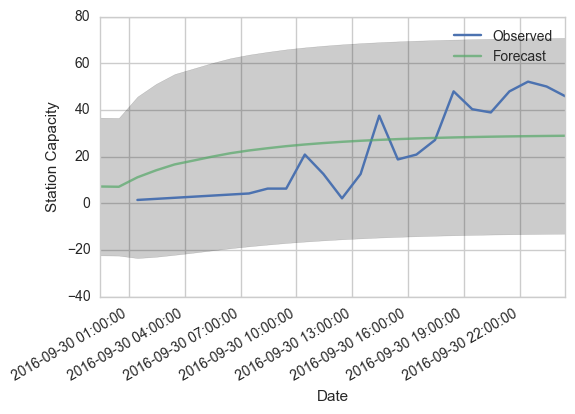

RMSE: 15.49


Station 31234
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


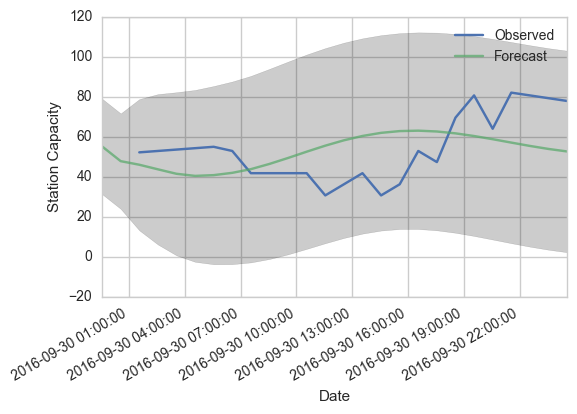

RMSE: 17.67


Station 31267
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


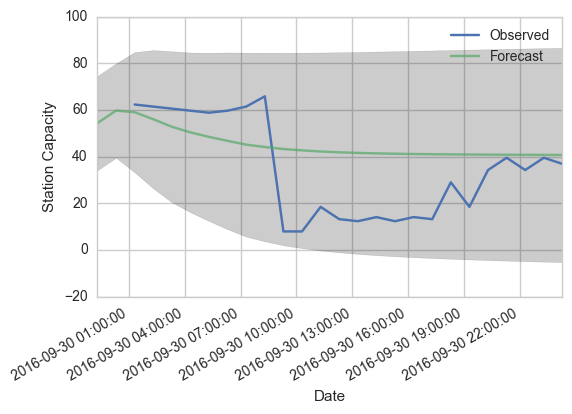

RMSE: 20.13


Station 31269
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


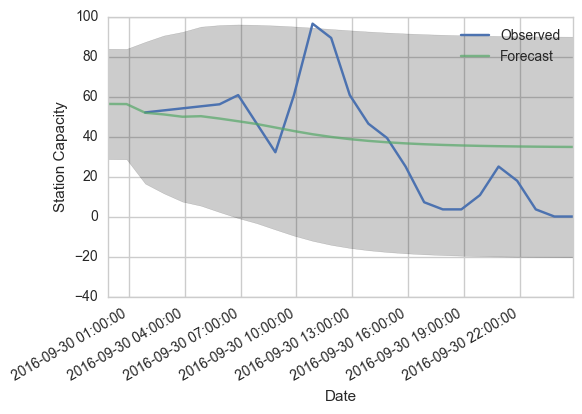

RMSE: 24.38


Station 31270
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


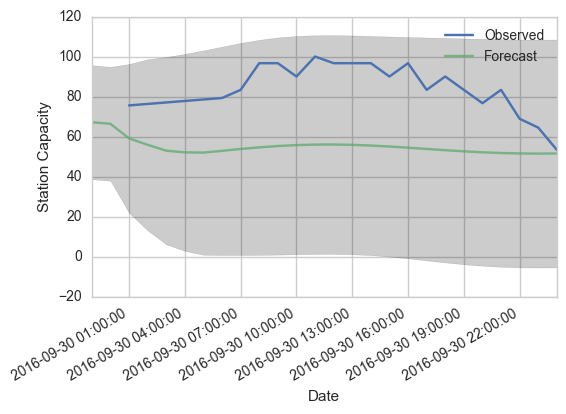

RMSE: 31.68


Station 31271
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


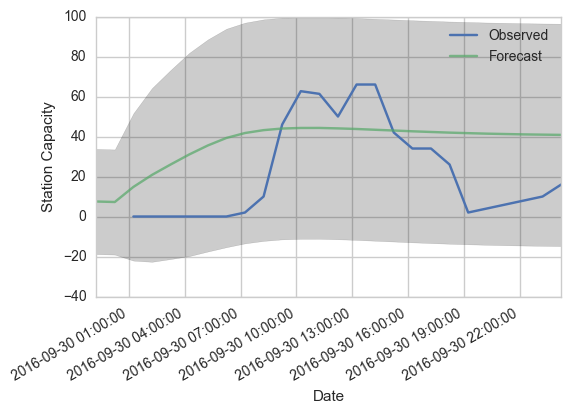

RMSE: 26.40


Station 31272
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


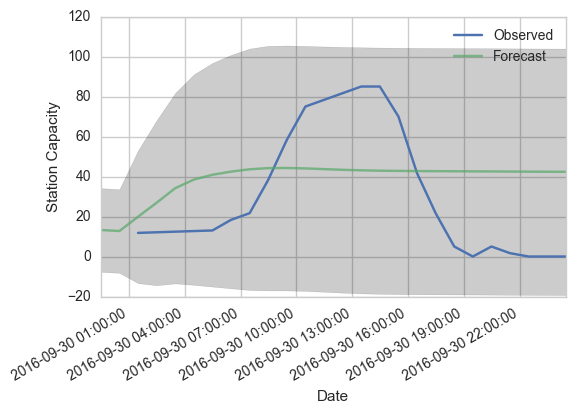

RMSE: 31.31


Station 31277
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


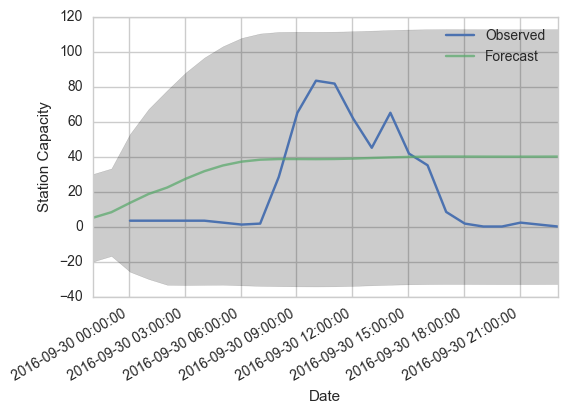

RMSE: 30.17


Station 31249
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



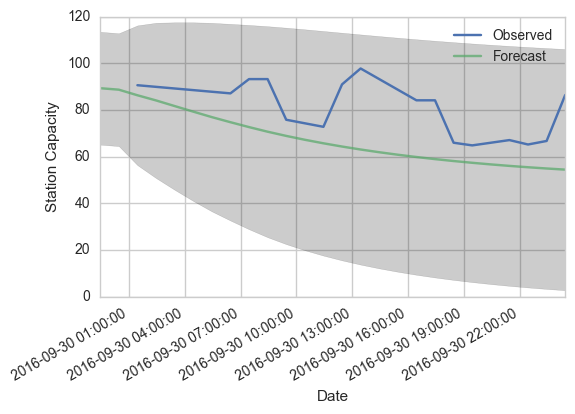

RMSE: 18.29


Station 31233
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


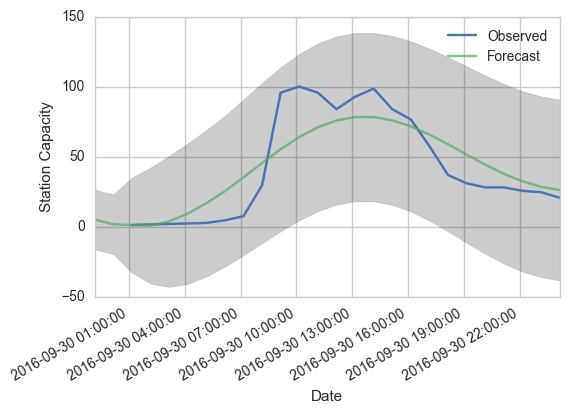

RMSE: 17.62


Station 31238
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


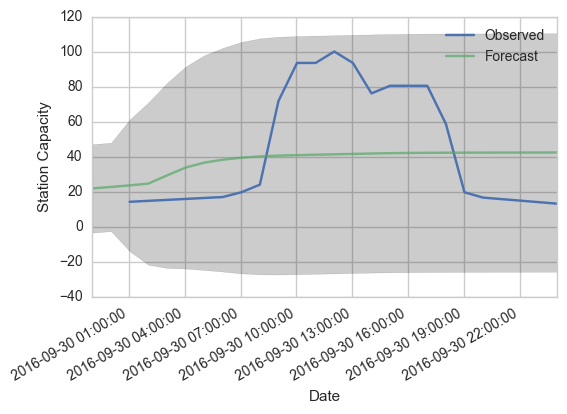

RMSE: 32.31


Station 31231
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


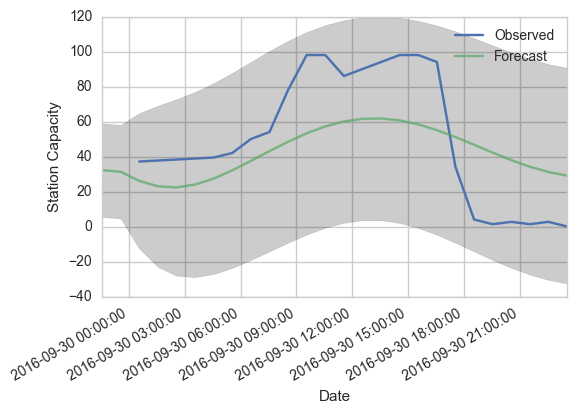

RMSE: 29.32


Station 31205
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


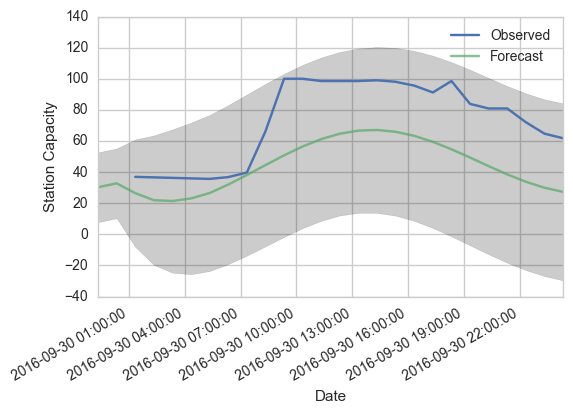

RMSE: 31.23


Station 31212
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


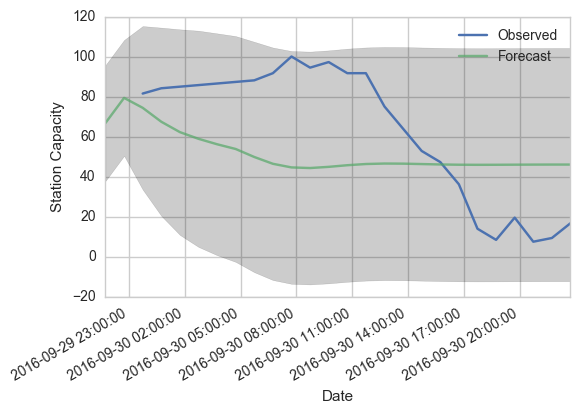

RMSE: 34.00


Station 31213
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


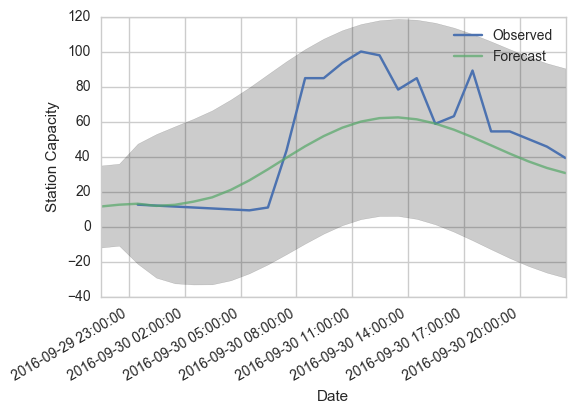

RMSE: 21.18


Station 31215
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


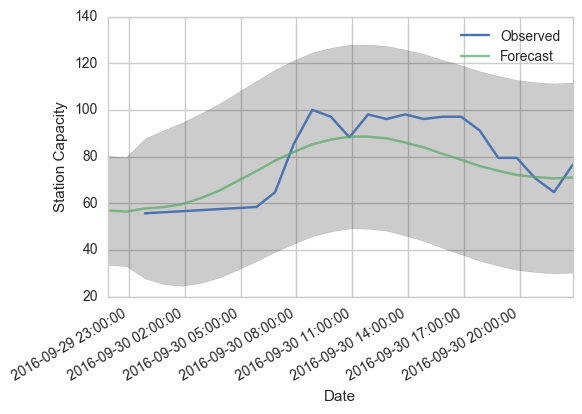

RMSE: 10.04


Station 31218
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


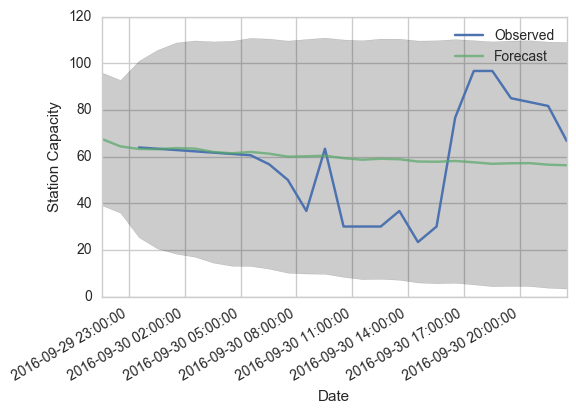

RMSE: 21.72


Station 31232
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


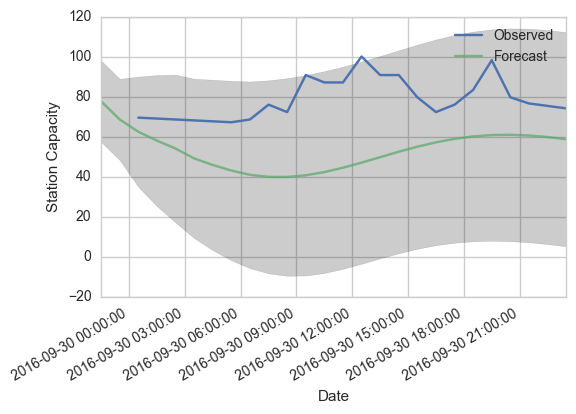

RMSE: 29.86


Station 31200
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


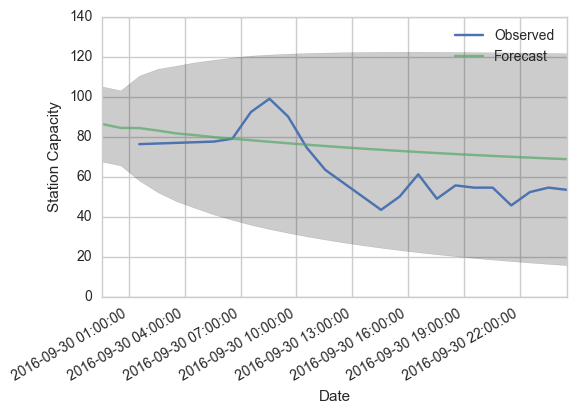

RMSE: 16.06


Station 31219
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


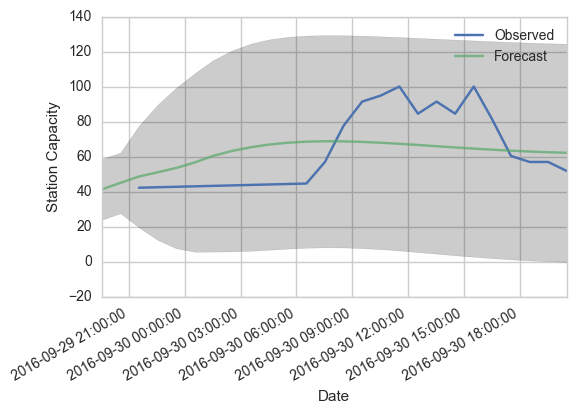

RMSE: 19.19


Station 31225
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


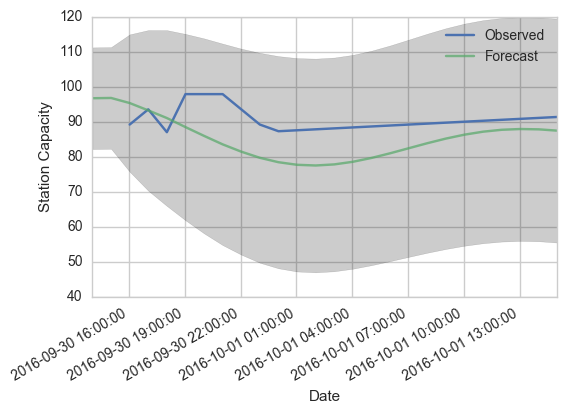

RMSE: 7.96


Station 31227
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


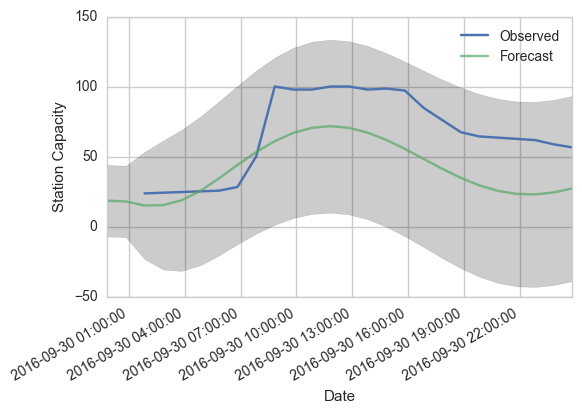

RMSE: 29.45


Station 31228
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


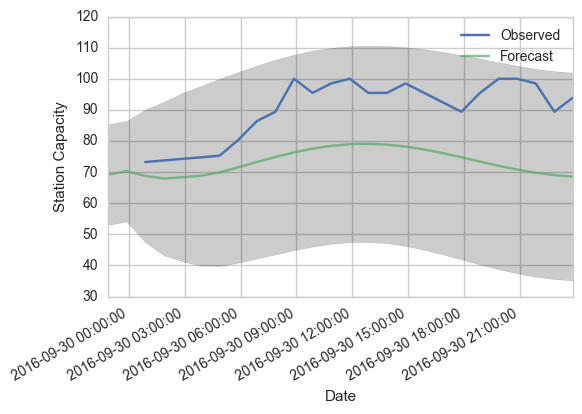

RMSE: 18.39


Station 31230
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


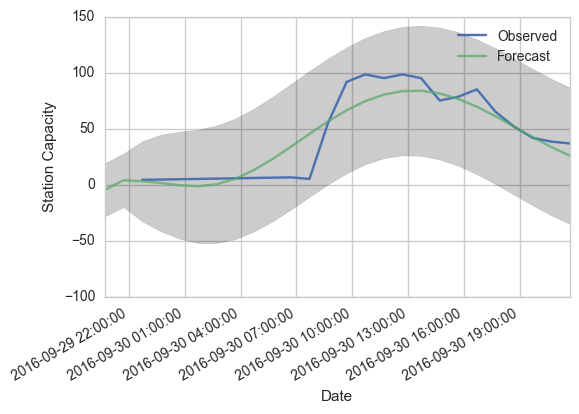

RMSE: 14.46


Station 31222
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


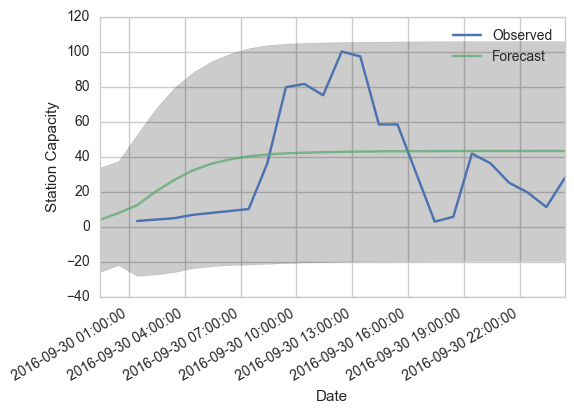

RMSE: 29.02




In [931]:
# Cluster 6 generalization
cluster6_stations = cluster_dict[6]

rmse_dict6 = {}
for station in cluster6_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[6][0], 
                           cluster_order_dict[6][1], 
                           cluster_order_dict[6][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict6[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31278
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


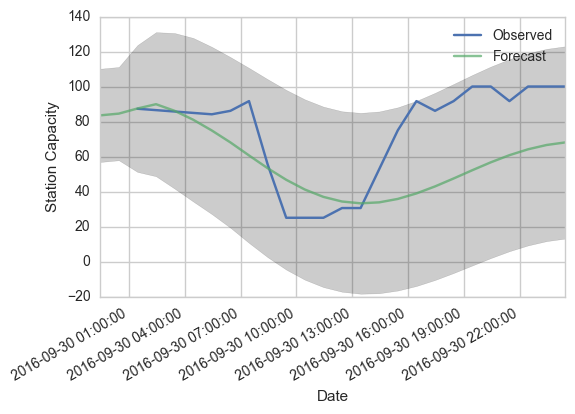

RMSE: 28.39


Station 31201
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



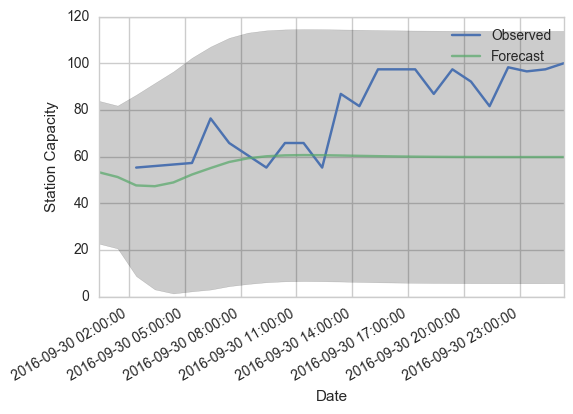

RMSE: 25.57


Station 31281
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


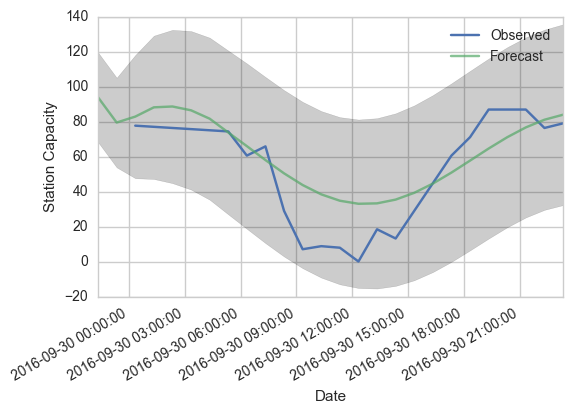

RMSE: 17.12


Station 31202
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


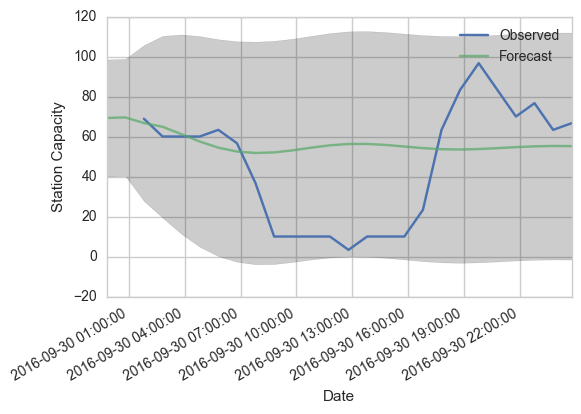

RMSE: 30.71


Station 31268
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



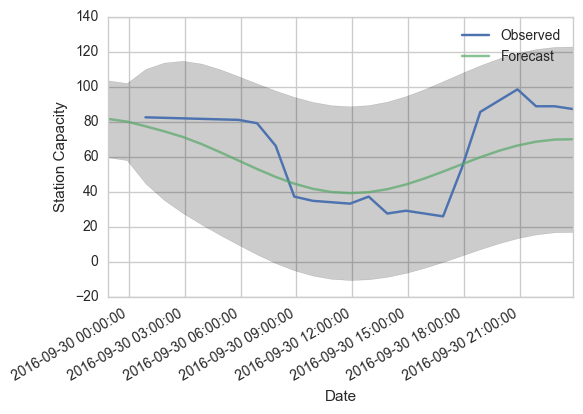

RMSE: 17.73


Station 31266
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


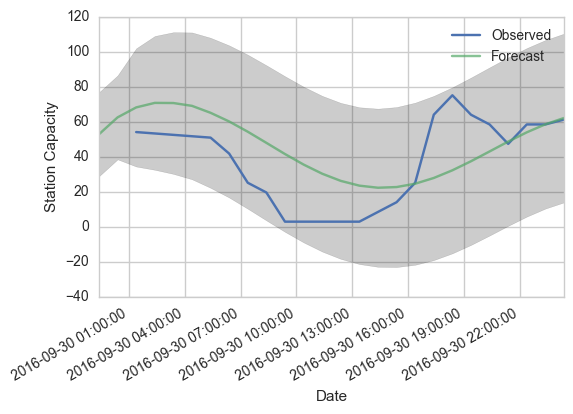

RMSE: 22.35


Station 31265
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


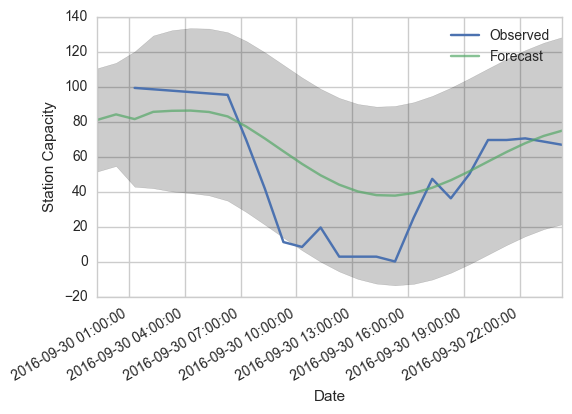

RMSE: 24.20


Station 31214
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


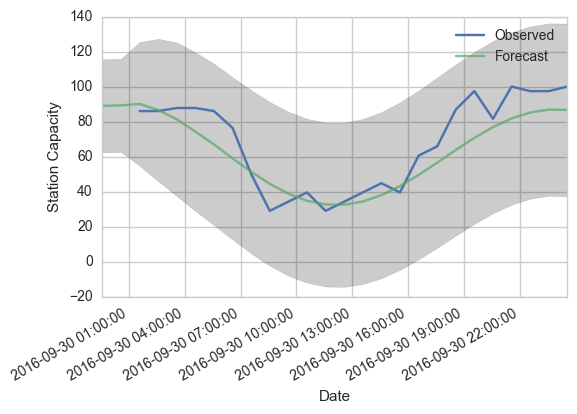

RMSE: 12.15


Station 31245
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


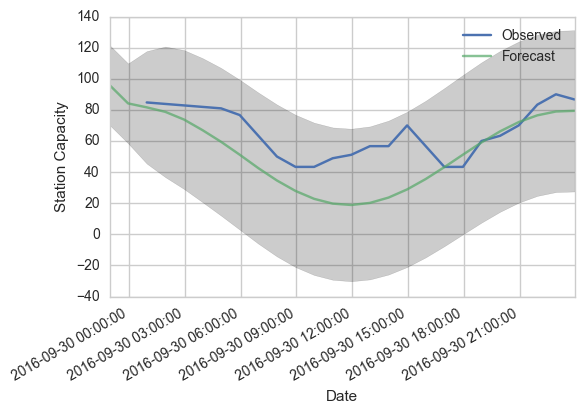

RMSE: 19.94


Station 31223
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


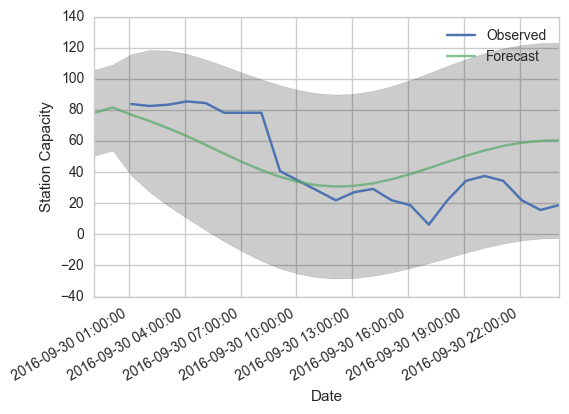

RMSE: 23.63


Station 31229
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


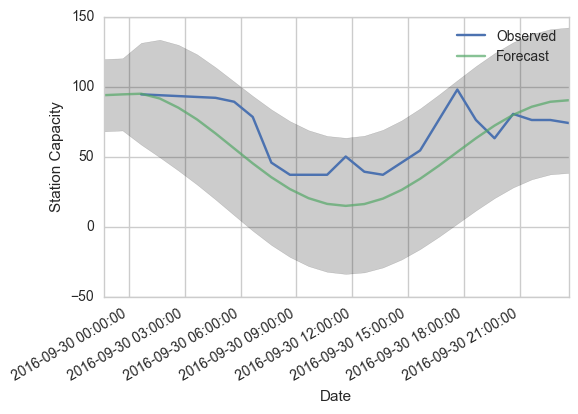

RMSE: 21.21


Station 31203
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


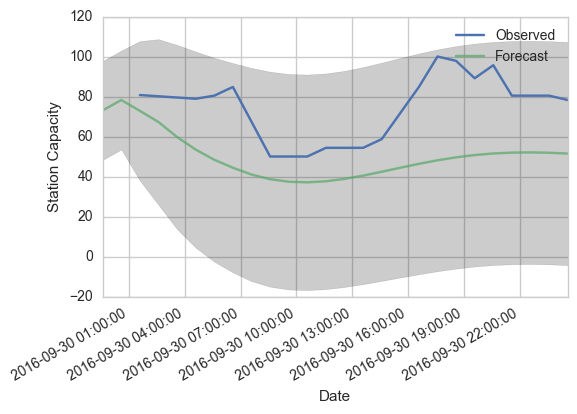

RMSE: 28.78




In [933]:
# Cluster 7 generalization
cluster7_stations = cluster_dict[7]

rmse_dict7 = {}
for station in cluster7_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[7][0], 
                           cluster_order_dict[7][1], 
                           cluster_order_dict[7][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict7[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31116
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


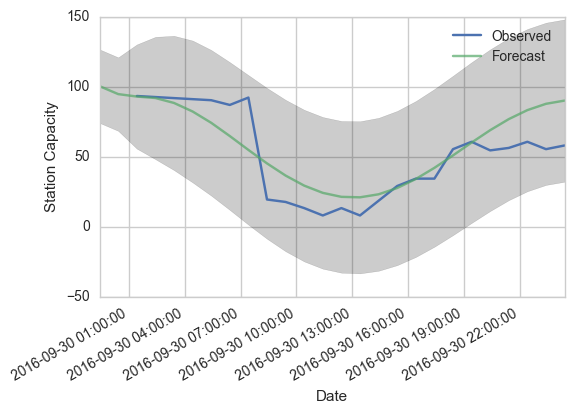

RMSE: 17.49


Station 31109
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


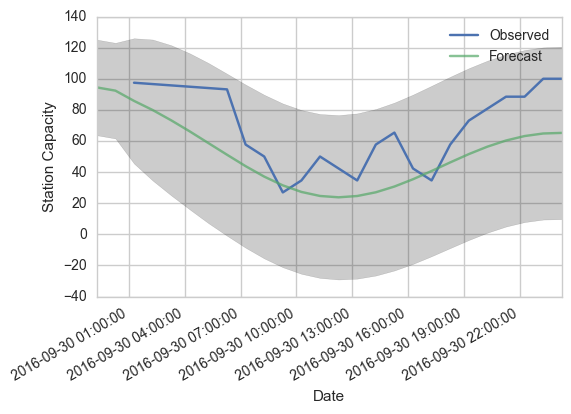

RMSE: 23.79


Station 31108
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


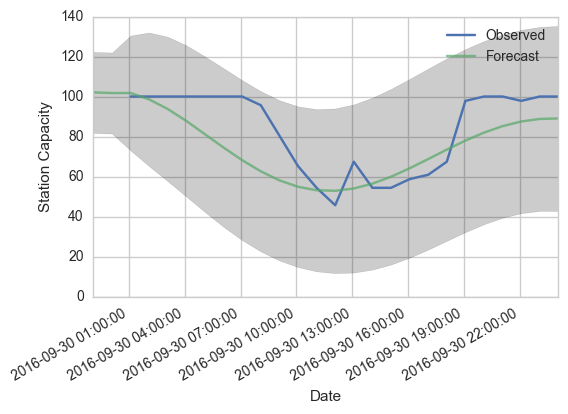

RMSE: 15.28


Station 31101
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


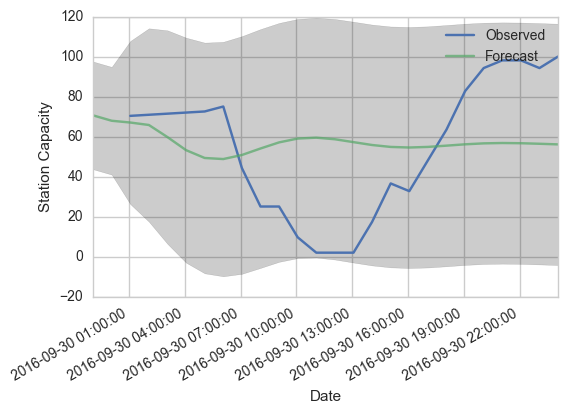

RMSE: 33.54




In [935]:
# Cluster 8 generalization
cluster8_stations = cluster_dict[8]

rmse_dict8 = {}
for station in cluster8_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[8][0], 
                           cluster_order_dict[8][1], 
                           cluster_order_dict[8][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict8[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31119
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


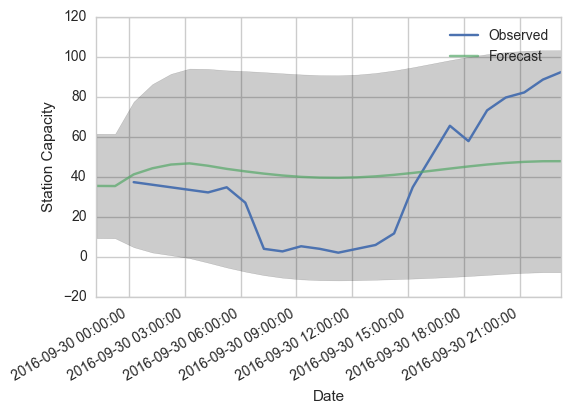

RMSE: 27.63


Station 31114
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


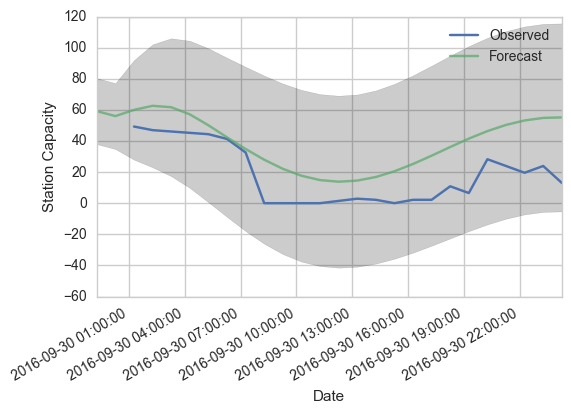

RMSE: 21.97


Station 31104
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


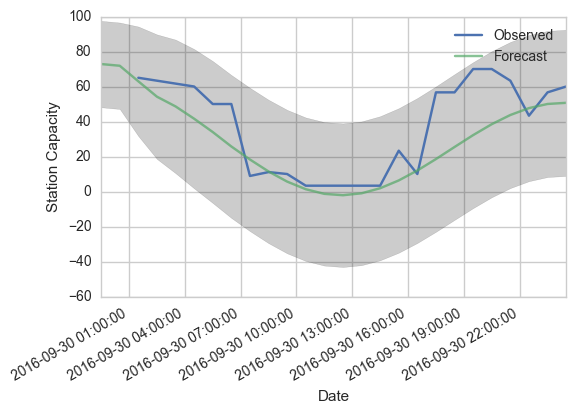

RMSE: 17.44




In [937]:
# Cluster 9 generalization
cluster9_stations = cluster_dict[9]

rmse_dict9 = {}
for station in cluster9_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[9][0], 
                           cluster_order_dict[9][1], 
                           cluster_order_dict[9][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict9[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31110
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


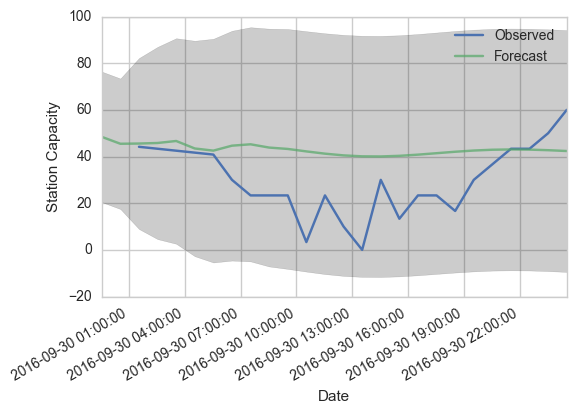

RMSE: 18.90




In [938]:
# Cluster 10 generalization
cluster10_stations = cluster_dict[10]

rmse_dict10 = {}
for station in cluster10_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[10][0], 
                           cluster_order_dict[10][1], 
                           cluster_order_dict[10][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict10[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31121
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



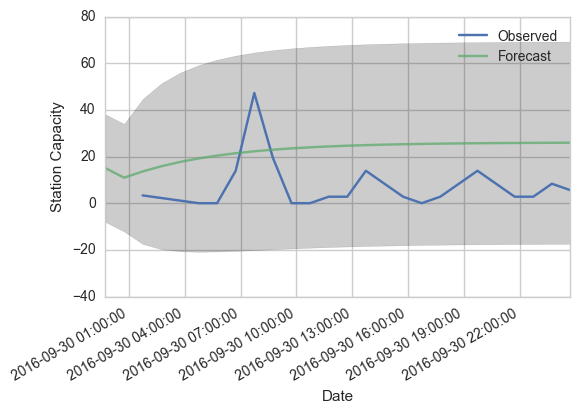

RMSE: 19.04




In [939]:
# Cluster 11 generalization
cluster11_stations = cluster_dict[11]

rmse_dict11 = {}
for station in cluster11_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[11][0], 
                           cluster_order_dict[11][1], 
                           cluster_order_dict[11][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict11[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31014
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



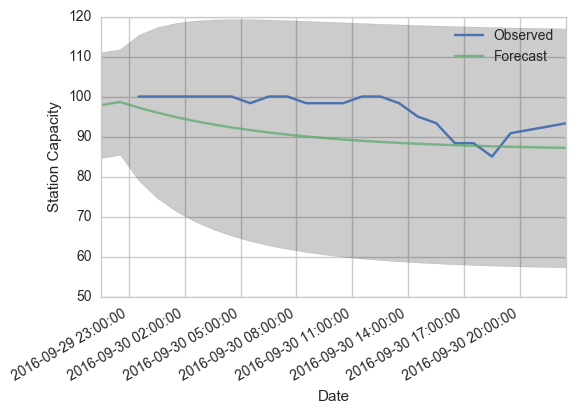

RMSE: 6.98




In [940]:
# Cluster 12 generalization
cluster12_stations = cluster_dict[12]

rmse_dict12 = {}
for station in cluster12_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 
    
    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    enforce_stationarity=True,
                    enforce_invertibility=True,
                    order=(cluster_order_dict[12][0], 
                           cluster_order_dict[12][1], 
                           cluster_order_dict[12][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict12[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

# With Exogenous Variable - 'Time Of Day'

Station 31628
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


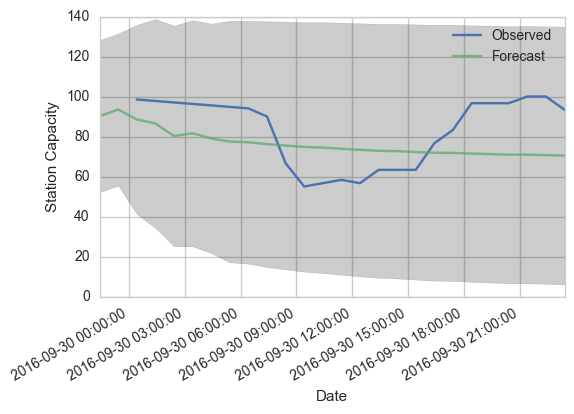

RMSE: 17.87


Station 31616
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


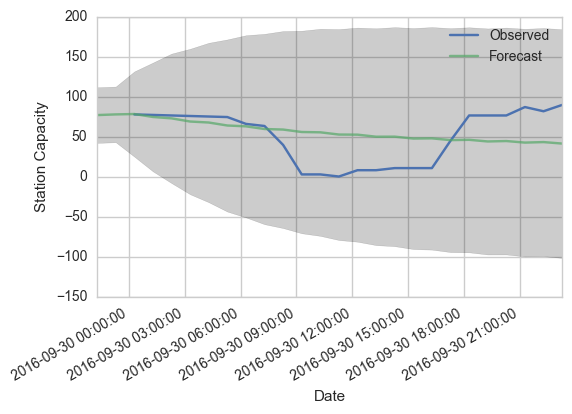

RMSE: 32.77


Station 31603
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


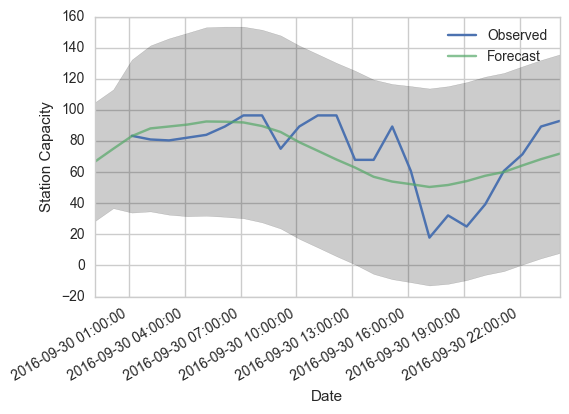

RMSE: 16.99


Station 31600
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


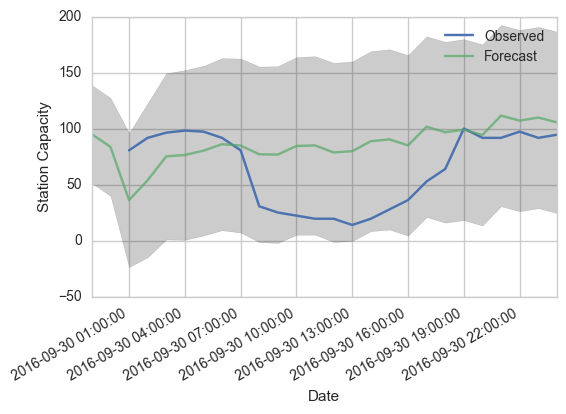

RMSE: 41.33


Station 31627
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


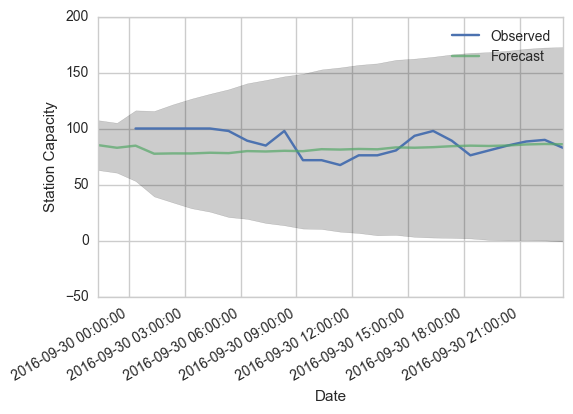

RMSE: 12.76




In [1007]:
# Cluster 1 generalization
cluster = 1
cluster1_stations = cluster_dict[cluster]

rmse_dict1 = {}
for station in cluster1_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict1[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31623
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



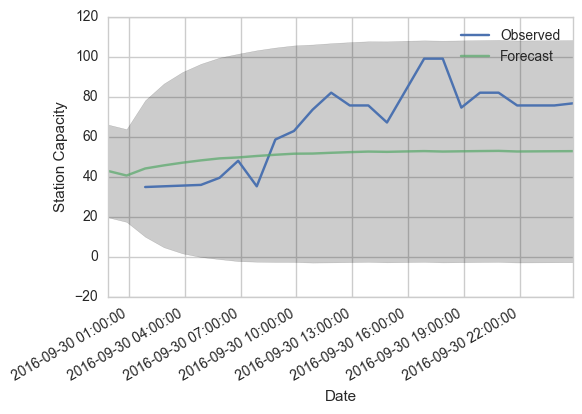

RMSE: 23.47




In [1008]:
# Cluster 2 generalization
cluster = 2
cluster1_stations = cluster_dict[cluster]

rmse_dict2 = {}
for station in cluster2_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict2[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31624
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



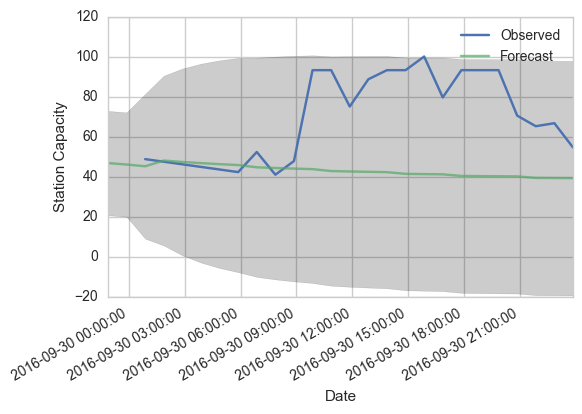

RMSE: 35.08




In [1009]:
# Cluster 3 generalization
cluster = 3
cluster3_stations = cluster_dict[cluster]

rmse_dict3 = {}
for station in cluster3_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict3[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31613
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



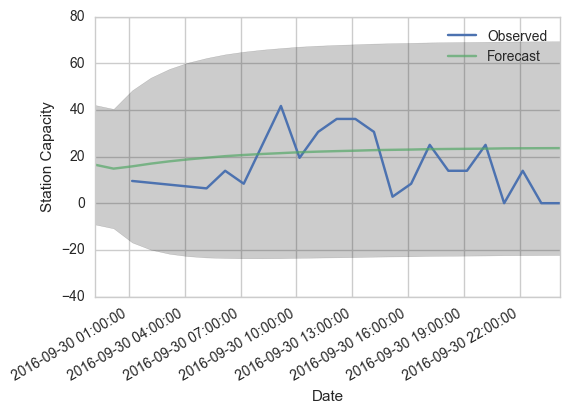

RMSE: 13.23




In [1010]:
# Cluster 4 generalization
cluster = 4
cluster4_stations = cluster_dict[cluster]

rmse_dict4 = {}
for station in cluster4_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict4[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31602
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


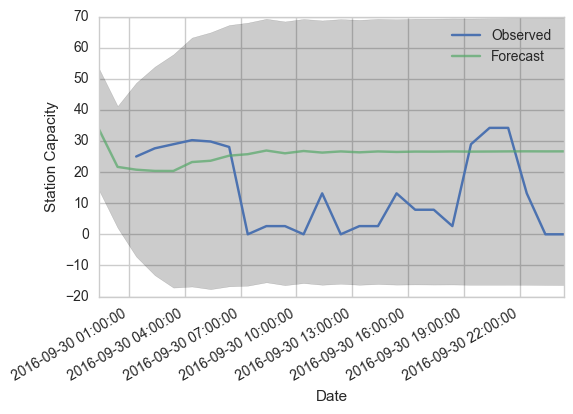

RMSE: 18.20




In [1011]:
# Cluster 5 generalization
cluster = 5
cluster5_stations = cluster_dict[cluster]

rmse_dict5 = {}
for station in cluster5_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict5[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31246
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


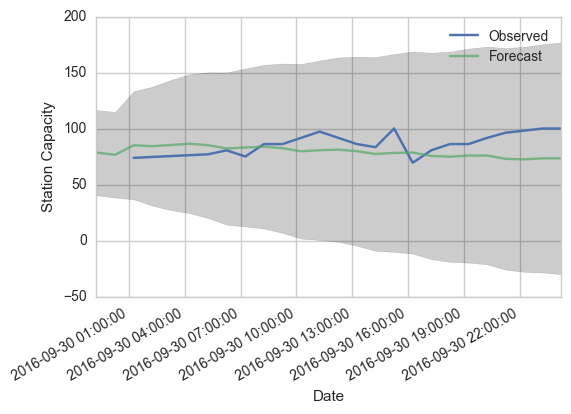

RMSE: 14.24


Station 31244
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


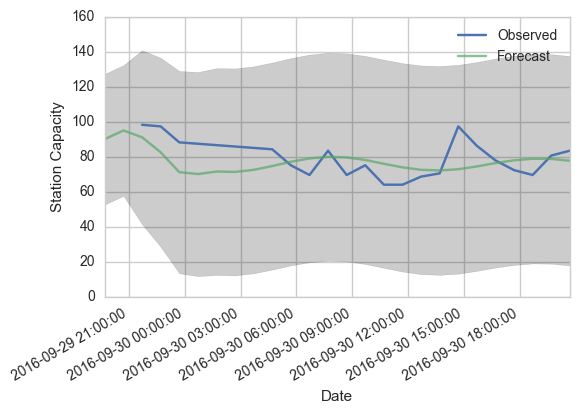

RMSE: 11.03


Station 31243
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


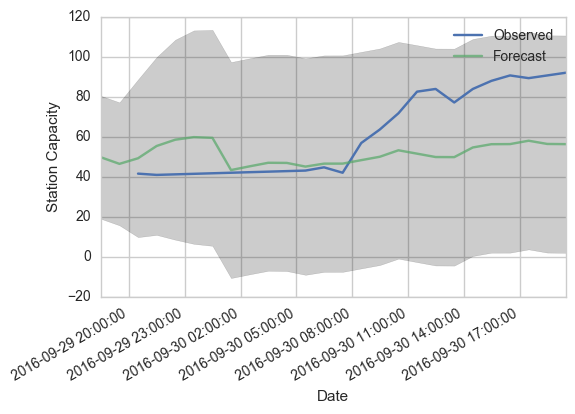

RMSE: 21.63


Station 31237
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


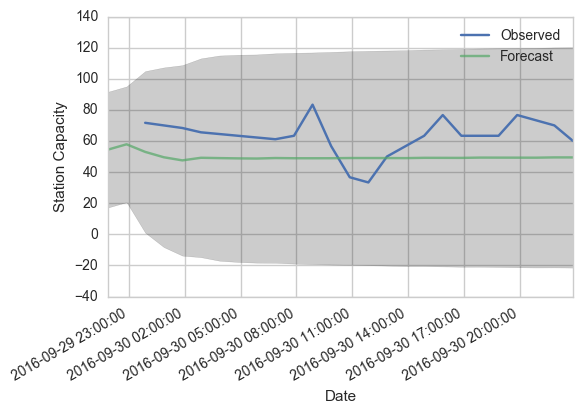

RMSE: 17.77


Station 31240
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


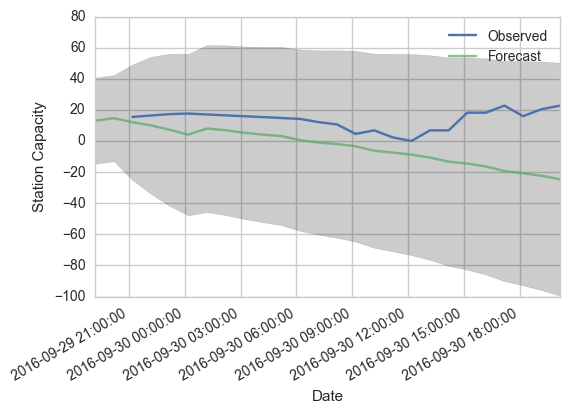

RMSE: 22.34


Station 31239
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


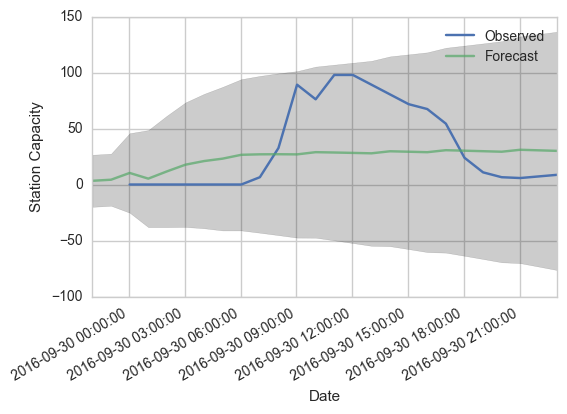

RMSE: 36.04


Station 31247
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


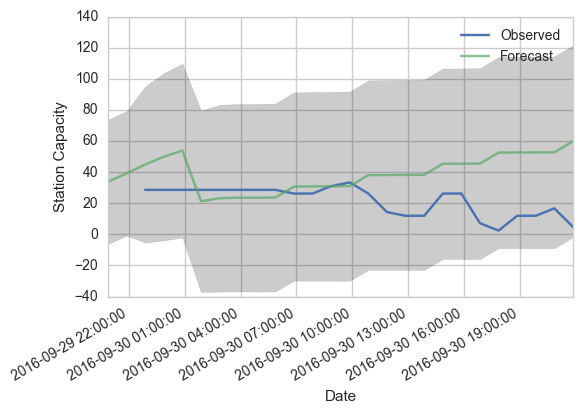

RMSE: 25.83


Station 31241
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


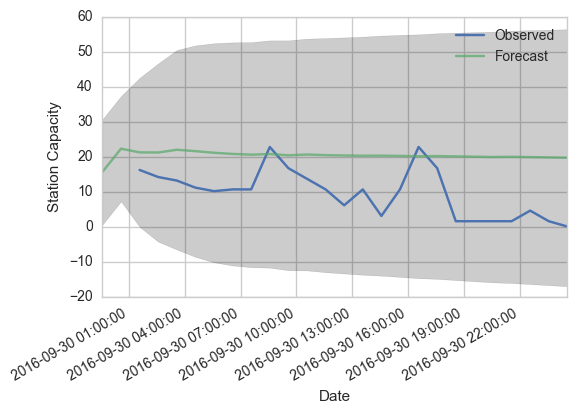

RMSE: 12.51


Station 31248
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


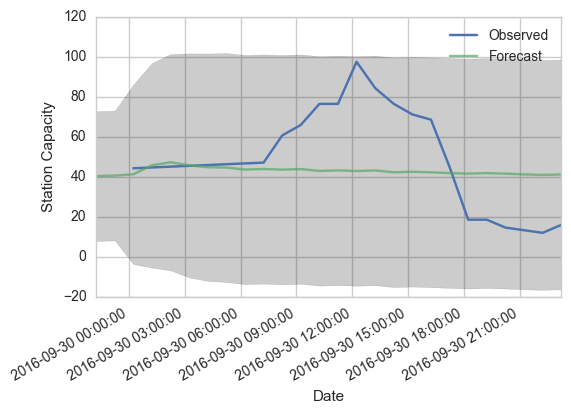

RMSE: 24.56


Station 31263
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


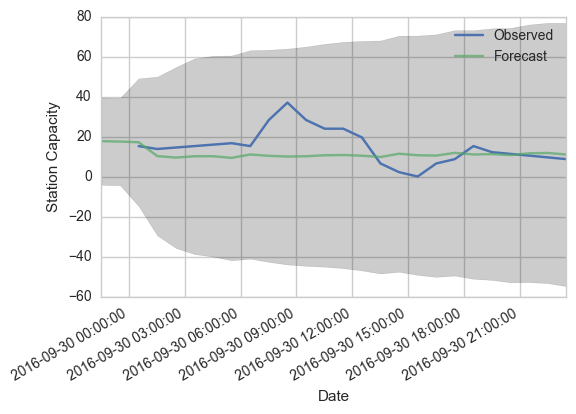

RMSE: 9.68


Station 31257
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


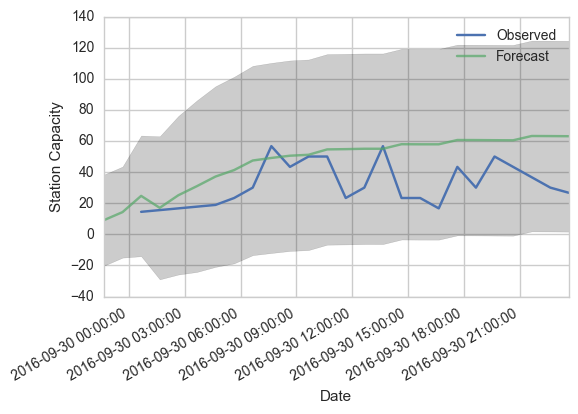

RMSE: 22.27


Station 31258
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


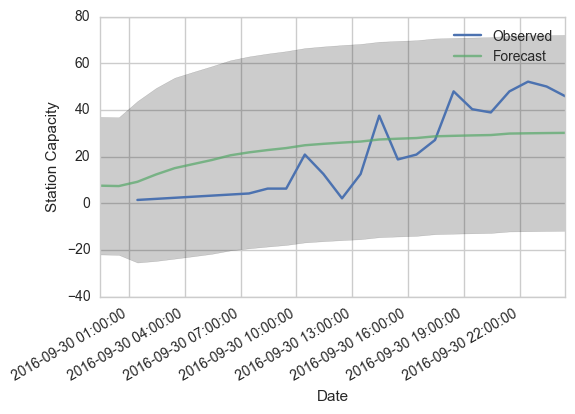

RMSE: 14.65


Station 31234
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


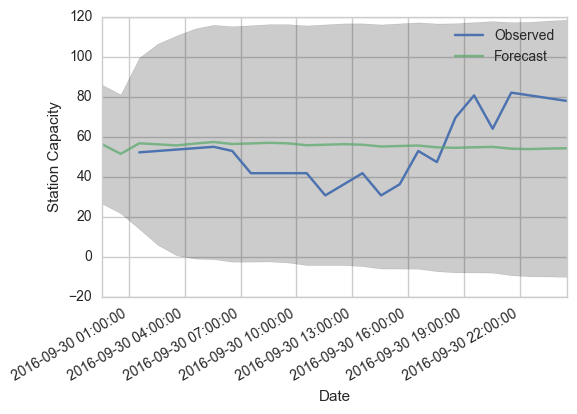

RMSE: 16.94


Station 31267
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


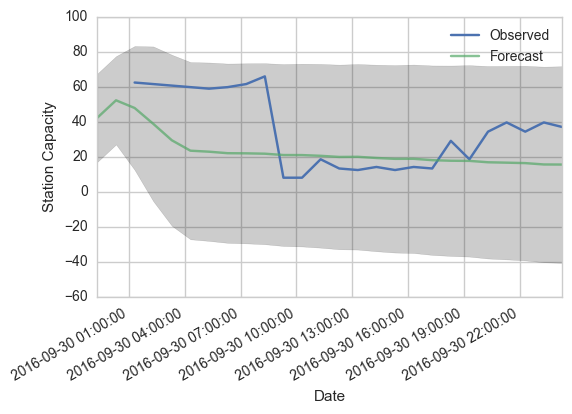

RMSE: 22.49


Station 31269
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


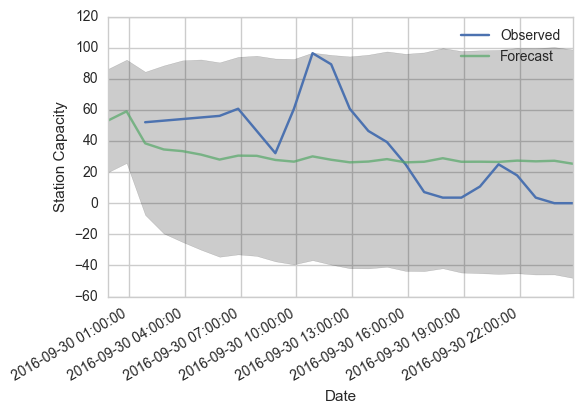

RMSE: 27.65


Station 31270
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


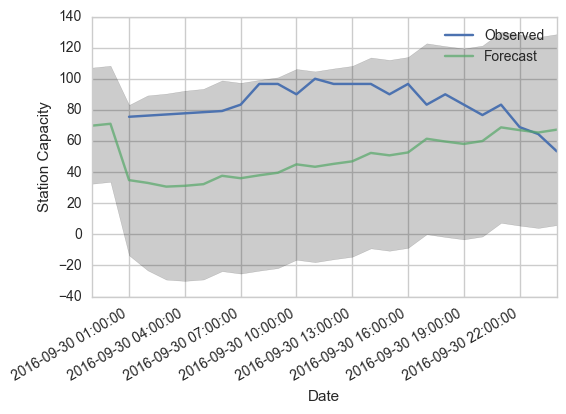

RMSE: 40.41


Station 31271
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


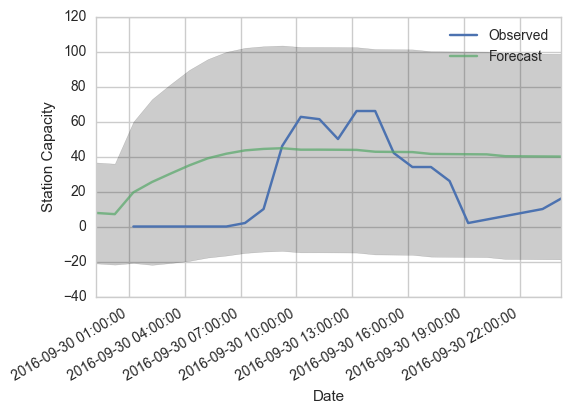

RMSE: 27.40


Station 31272
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


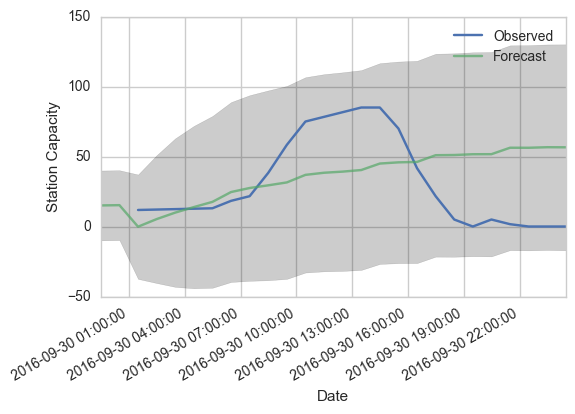

RMSE: 35.66


Station 31277
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


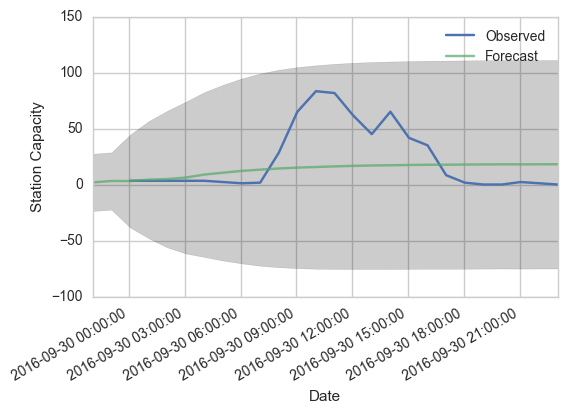

RMSE: 28.70


Station 31249
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


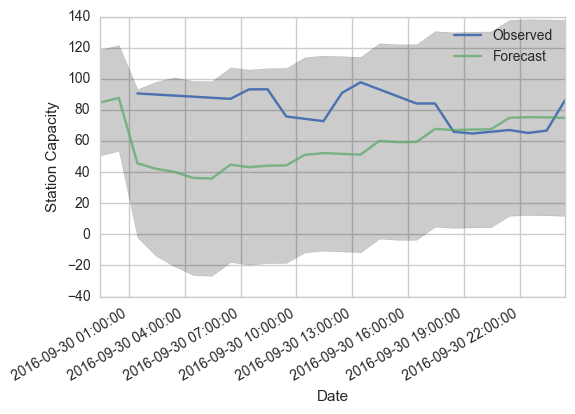

RMSE: 33.97


Station 31233
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


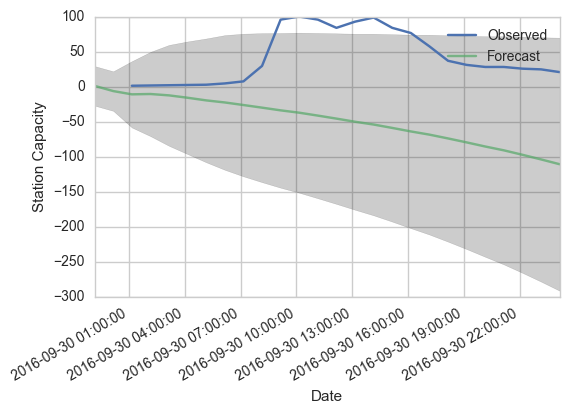

RMSE: 107.75


Station 31238
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


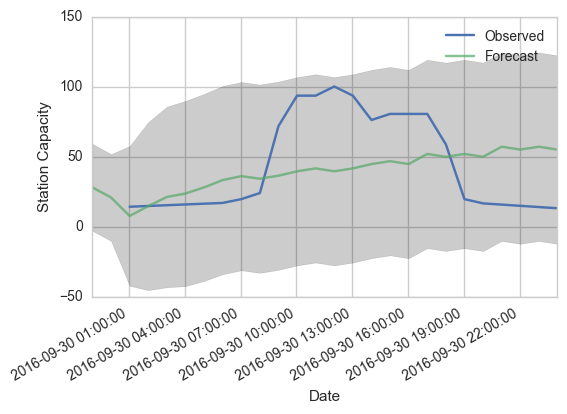

RMSE: 33.88


Station 31231
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


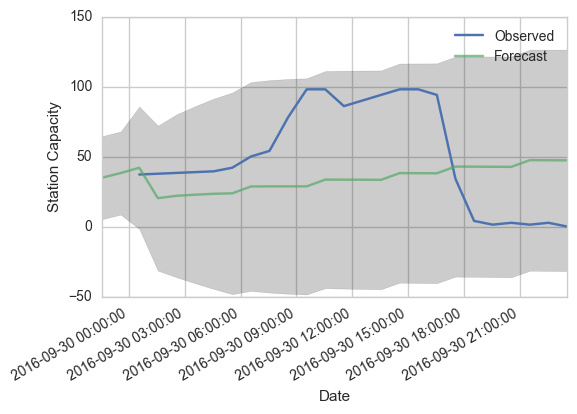

RMSE: 43.36


Station 31205
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


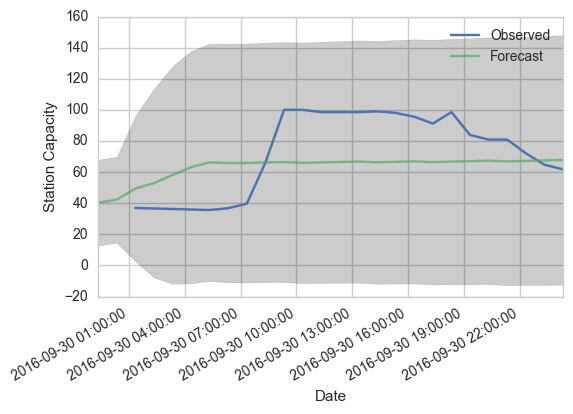

RMSE: 24.75


Station 31212
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


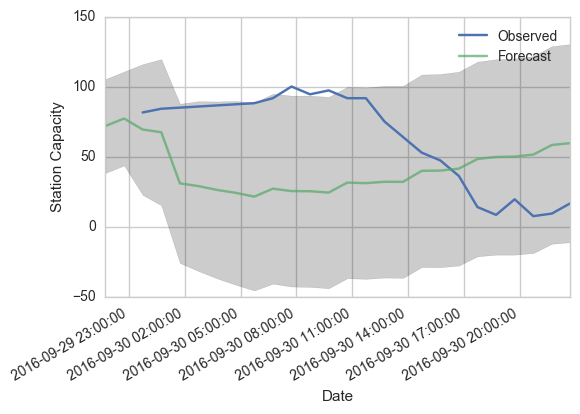

RMSE: 49.58


Station 31213
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


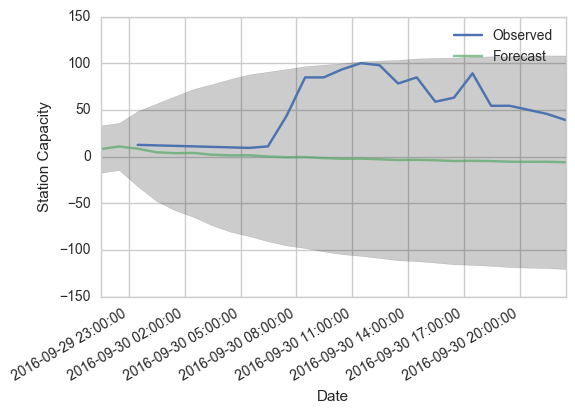

RMSE: 62.50


Station 31215
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


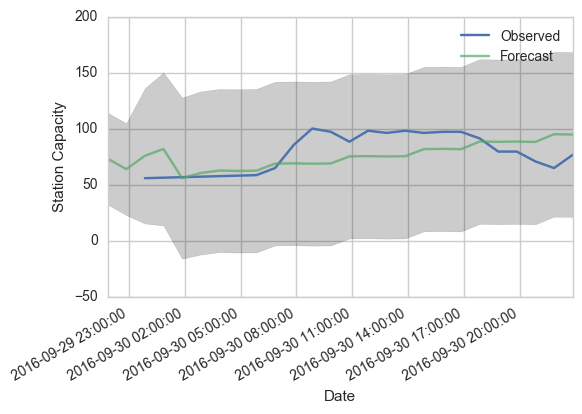

RMSE: 17.36


Station 31218
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


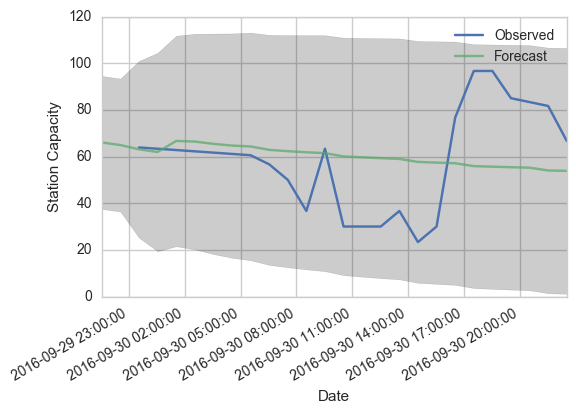

RMSE: 22.63


Station 31232
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


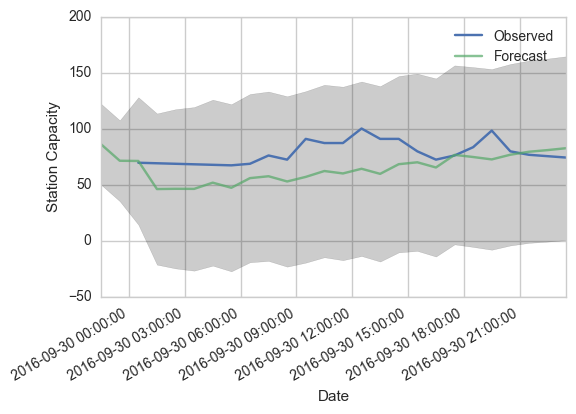

RMSE: 19.73


Station 31200
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


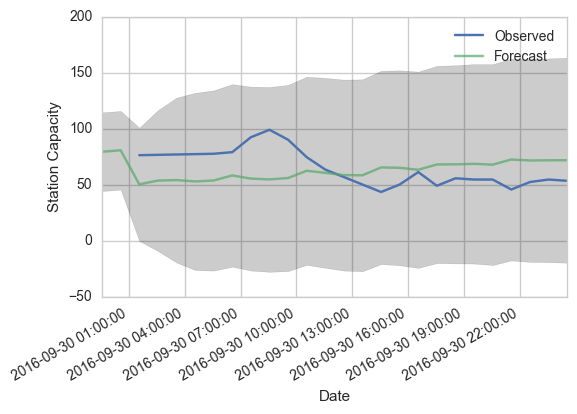

RMSE: 21.76


Station 31219
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


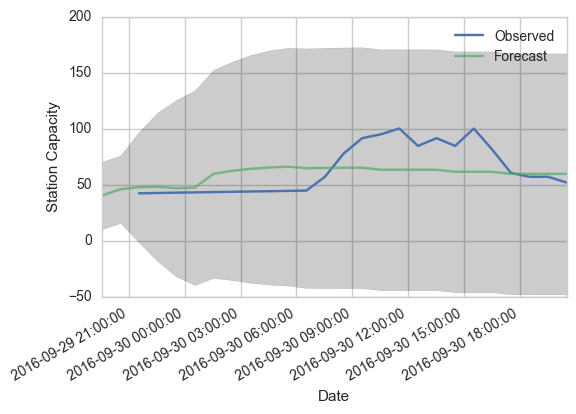

RMSE: 19.83


Station 31225
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


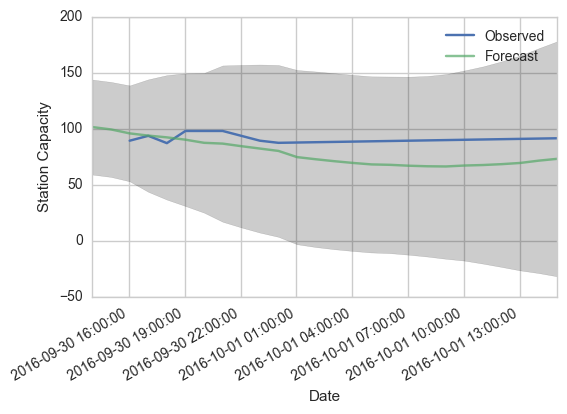

RMSE: 16.85


Station 31227
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



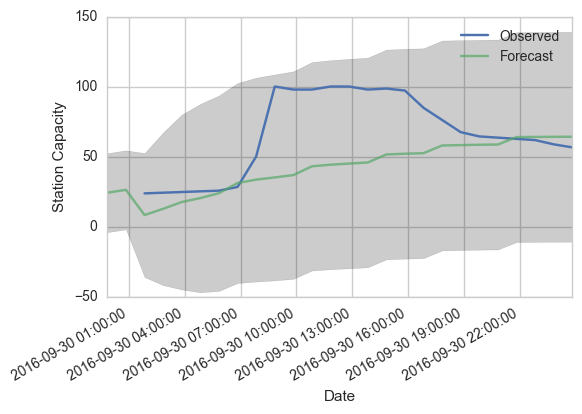

RMSE: 33.17


Station 31228
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


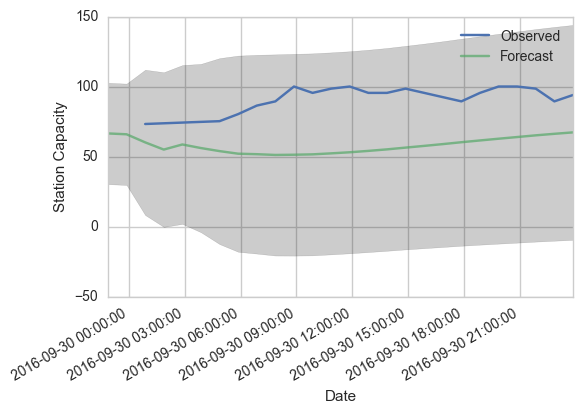

RMSE: 34.42


Station 31230
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



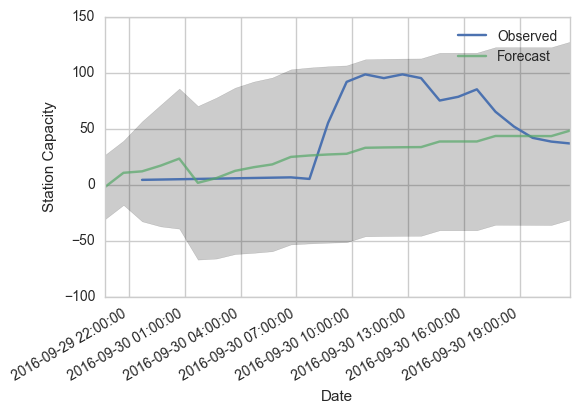

RMSE: 34.44


Station 31222
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



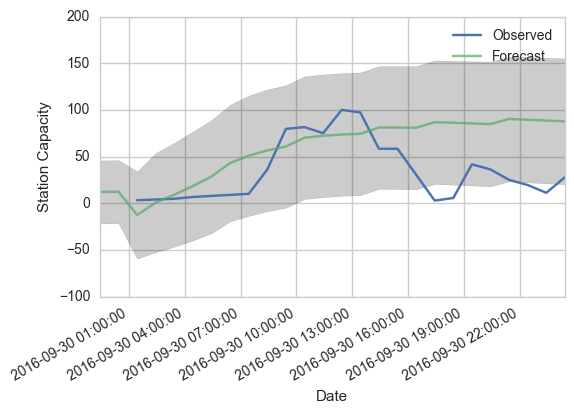

RMSE: 43.76




In [1012]:
# Cluster 6 generalization
cluster = 6
cluster6_stations = cluster_dict[cluster]

rmse_dict6 = {}
for station in cluster6_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict6[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31278
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


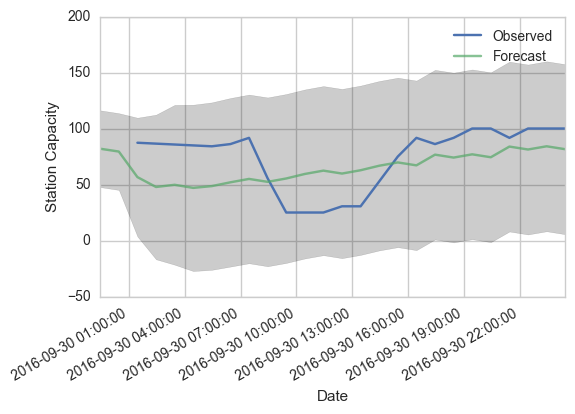

RMSE: 27.21


Station 31201
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


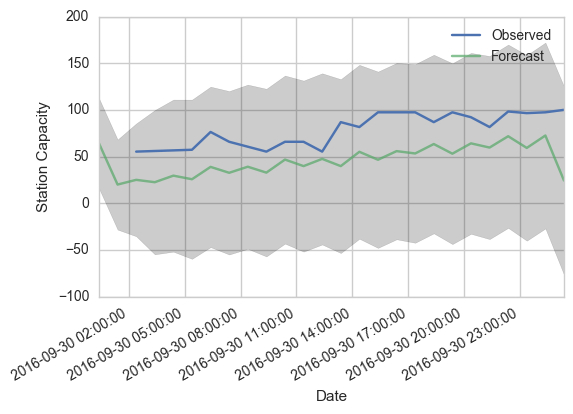

RMSE: 35.21


Station 31281
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


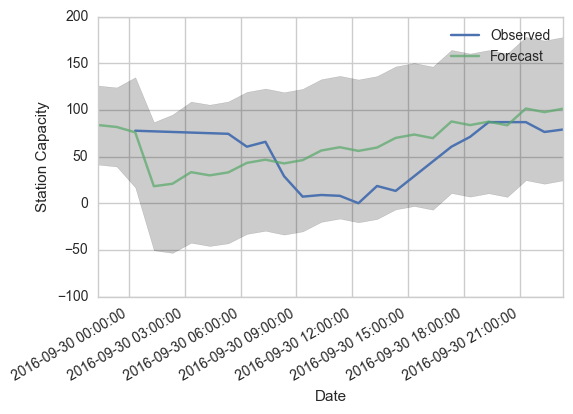

RMSE: 36.62


Station 31202
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


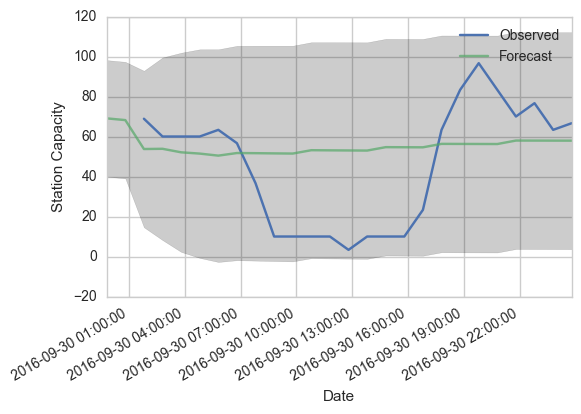

RMSE: 29.59


Station 31268
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


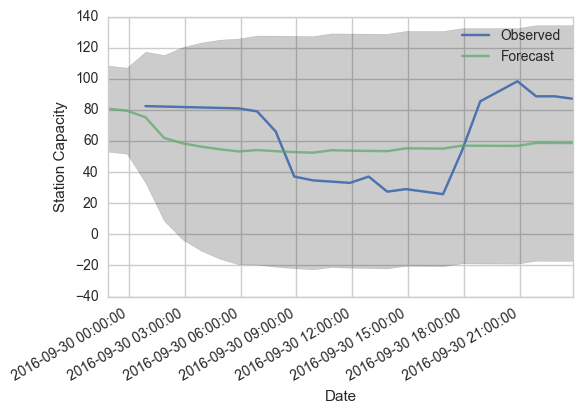

RMSE: 24.96


Station 31266
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


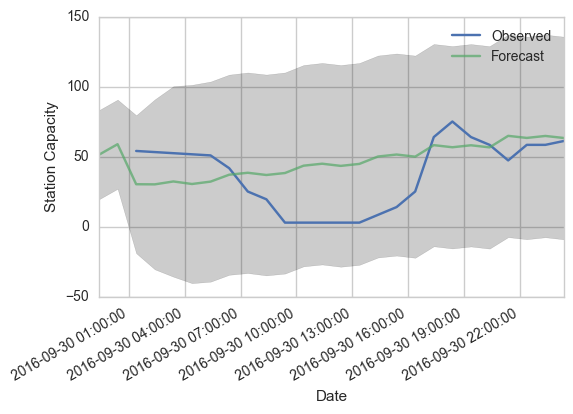

RMSE: 25.37


Station 31265
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


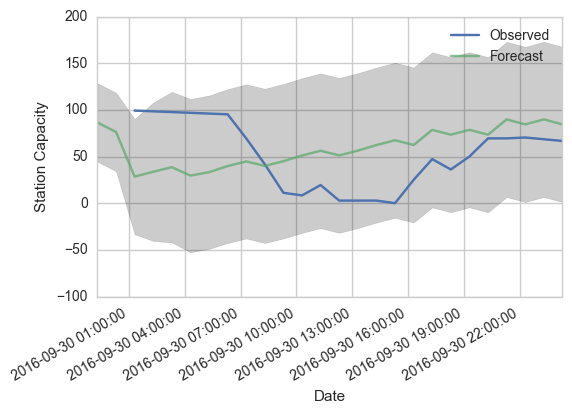

RMSE: 44.92


Station 31214
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


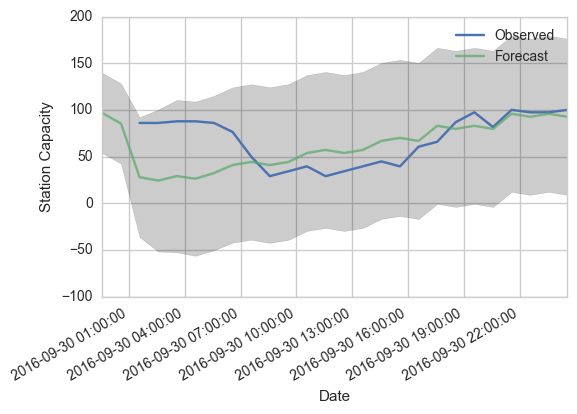

RMSE: 30.70


Station 31245
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


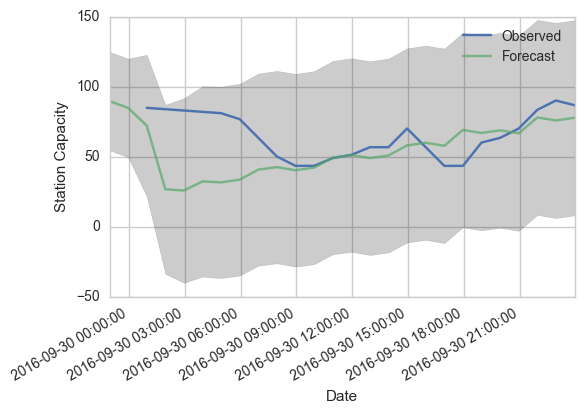

RMSE: 25.47


Station 31223
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


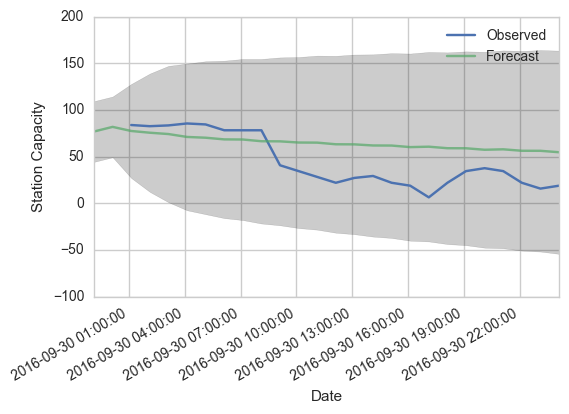

RMSE: 29.70


Station 31229
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


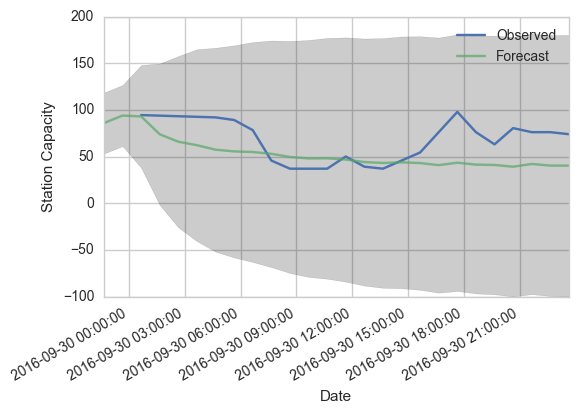

RMSE: 26.46


Station 31203
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


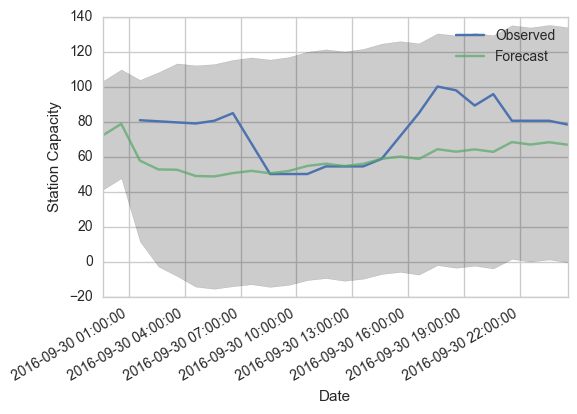

RMSE: 21.46




In [1013]:
# Cluster 7 generalization
cluster = 7
cluster7_stations = cluster_dict[cluster]

rmse_dict7 = {}
for station in cluster7_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict7[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31116
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


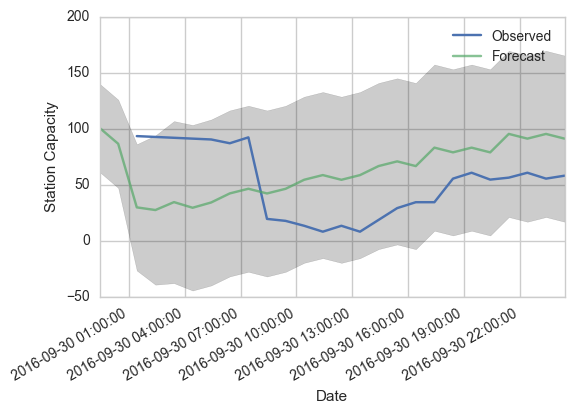

RMSE: 44.14


Station 31109
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


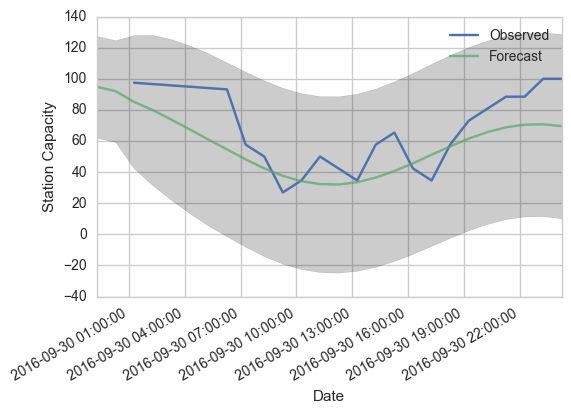

RMSE: 19.52


Station 31108
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


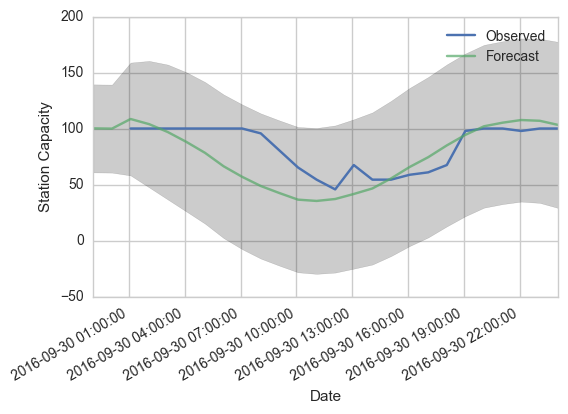

RMSE: 20.50


Station 31101
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


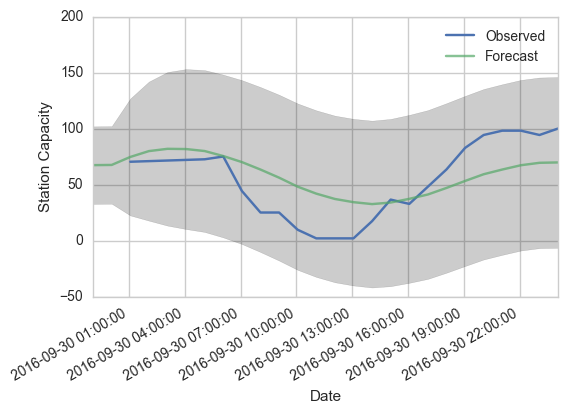

RMSE: 25.16




In [1014]:
# Cluster 8 generalization
cluster = 8
cluster8_stations = cluster_dict[cluster]

rmse_dict8 = {}
for station in cluster8_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict8[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31119
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


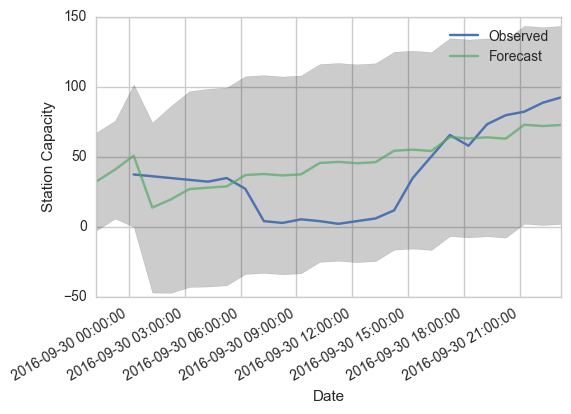

RMSE: 24.85


Station 31114
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


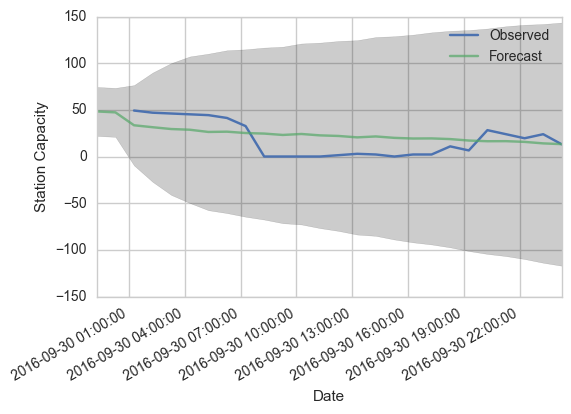

RMSE: 16.40


Station 31104
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


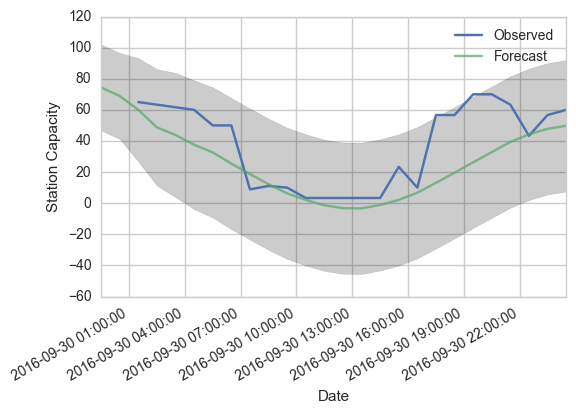

RMSE: 20.41




In [1015]:
# Cluster 9 generalization
cluster = 9
cluster9_stations = cluster_dict[cluster]

rmse_dict9 = {}
for station in cluster9_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict9[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31110
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



/Users/WhoaaaItsDavid/anaconda/envs/py35/lib/python3.5/site-packages/statsmodels/base/model.py:496: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


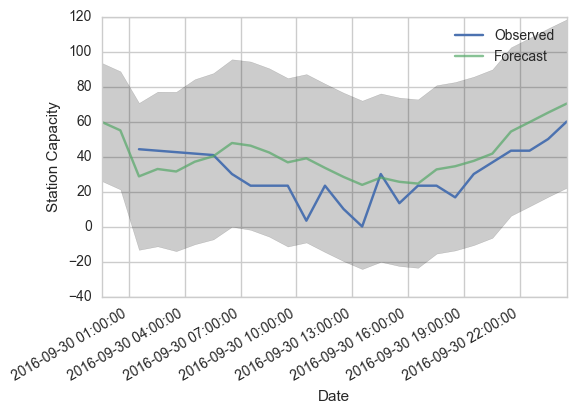

RMSE: 15.15




In [1017]:
# Cluster 10 generalization
cluster = 10
cluster10_stations = cluster_dict[cluster]

rmse_dict10 = {}
for station in cluster10_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict10[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))

Station 31121
Results of Dickey-Fuller Test:
We are 99% confident that the series is stationary.



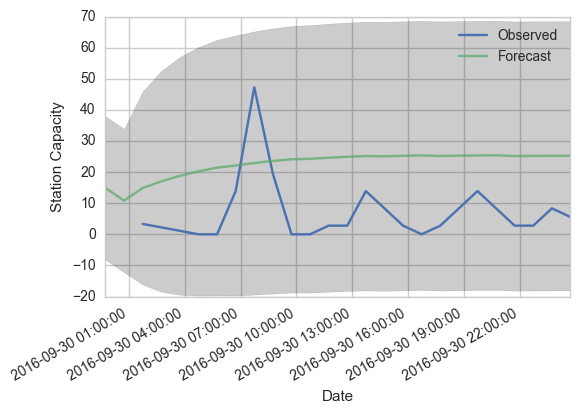

RMSE: 19.14




In [1018]:
# Cluster 11 generalization
cluster = 11
cluster11_stations = cluster_dict[cluster]

rmse_dict11 = {}
for station in cluster11_stations:
    
    # Mask for station and transform to series object
    station_df = new_target_discrete_bike_data[new_target_discrete_bike_data['Station_Number'] == station]
    station_df = station_df[['Count_Percent_Capacity', 'Date']]
    series_station = station_df.set_index('Date')
    series_station = series_station['Count_Percent_Capacity'] 

    # Create exogenous variables and transform to series object
    times_of_day = [0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5]
    station_df['Time_Of_Day'] = station_df['Date'].map(lambda x: times_of_day[datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").hour-1])
    exog_data = station_df.set_index('Date')
    exog_data = exog_data[['Time_Of_Day']]

    # Test stationarity
    print('Station {}'.format(station))
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(series_station, autolag='AIC')
    if dftest[0] < dftest[4]['1%']:
        print('We are 99% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['5%']:
        print('We are 95% confident that the series is stationary.\n')
    elif dftest[0] < dftest[4]['10%']:
        print('We are 90% confident that the series is stationary.\n')
    else:
        print('We are not confident that the series is stationary.\n')
    
    # SARIMAX Model without exogs
    X = series_station.copy()
    size = int(len(X) * 0.995)
    exog_train, exog_test = exog_data[(int(len(exog_data) * 0.90)):-25], exog_data[-25:]
    X_train, X_test = X[(int(len(X) * 0.90)):-25], X[-24:]

    model = SARIMAX(X_train,
                    exog=exog_train,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                    order=(cluster_order_dict[cluster][0], 
                           cluster_order_dict[cluster][1], 
                           cluster_order_dict[cluster][2]),
                    #seasonal_order=(0,1,2,12), 
                    trend='c')
    results_SARIMAX = model.fit()
    
    # Plot the forecast
    pred = results_SARIMAX.get_prediction(start=X_train.index[-1], 
                                          end=X_test.index[-1],
                                          exog=exog_test,                                          
                                          dynamic=False)
    pred_ci = pred.conf_int()

    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)

    ax = X_test.plot(label='Observed')
    pred.predicted_mean.plot(ax=ax, label='Forecast', alpha=.7)

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

    ax.set_xlabel('Date')
    ax.set_ylabel('Station Capacity')
    plt.legend()

    plt.show()
    
    # Compute the RMSE
    y_forecasted = pred.predicted_mean
    y_truth = X_test
    mse = ((y_forecasted - y_truth) ** 2).mean()
    rmse = mse**0.5
    rmse_dict11[station] = rmse
    print('RMSE: {:.2f}\n\n'.format(rmse))